In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import osmnx as ox
import networkx as nx

import scipy.stats as stats
import statsmodels.api as sm
import seaborn as sns

from shapely.geometry import Point
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from sklearn.preprocessing import StandardScaler

from esda.moran import Moran_Local
from splot.esda import lisa_cluster
from libpysal.weights import Queen, KNN
from esda.moran import Moran
from spreg import OLS, ML_Lag
from spreg import ML_Error

In [2]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.path import Path
from matplotlib.patches import PathPatch

def add_north_arrow(ax, bounds, scale_width=0.02, scale_height=0.05, fontsize=14, x_offset=0.95, y_offset=0.05):
    x = bounds[0] + (bounds[2] - bounds[0]) * x_offset
    y = bounds[3] - (bounds[3] - bounds[1]) * y_offset
    
    map_width = bounds[2] - bounds[0]
    map_height = bounds[3] - bounds[1]
    width = map_width * scale_width
    height = map_height * scale_height
    vertices = [
        (x, y), 
        (x - width/2, y - height), 
        (x + width/2, y - height), 
        (x, y)  
    ]
    codes = [Path.MOVETO] + [Path.LINETO]*2 + [Path.CLOSEPOLY]
    path = Path(vertices, codes)
    
    arrow = PathPatch(path, facecolor='black', edgecolor='black')
    ax.add_patch(arrow)
    plt.text(x, y + height/4, 'N', 
             horizontalalignment='center',
             verticalalignment='center',
             fontsize=fontsize,
             fontweight='bold')

def add_scalebar(ax, bounds, length=5, label=None,
                 bar_height_ratio=0.01,
                 x_offset=0.95, y_offset=0.1,
                 color="black", lw=2, fontsize=10):
    if label is None:
        label = f"{length}"
    xmin, ymin, xmax, ymax = bounds
    map_width = xmax - xmin
    map_height = ymax - ymin
    x0 = xmin + map_width * x_offset
    y0 = ymin + map_height * y_offset

    bar_height = map_height * bar_height_ratio
    ax.plot([x0, x0 + length], [y0, y0], color=color, lw=lw, solid_capstyle='butt')
    ax.plot([x0, x0], [y0, y0 + bar_height], color=color, lw=lw)
    ax.plot([x0 + length, x0 + length], [y0, y0 + bar_height], color=color, lw=lw)
    ax.text(x0 + length / 2, y0 + bar_height * 2,
            label, ha='center', va='bottom',
            fontsize=fontsize, color=color, weight='bold')

# Compute the Distance Matrix (OD)

### 1. Create the Graph

In [3]:
#G = ox.graph_from_place('Greater London, England', network_type='drive')

In [ ]:
#nodes, edges = ox.graph_to_gdfs(G)

NameError: name 'G' is not defined

In [ ]:
#nodes.to_file("nodes11.gpkg", driver="GPKG")
#edges.to_file("edges11.gpkg", driver="GPKG")

In [5]:
London = gpd.read_file("boundaries/london_boundary/London_GLA_Boundary.shp")
LAD = gpd.read_file("boundaries/Local_Authority_Districts_December_2024_Boundaries_UK_BFC_-5800161498345042609.gpkg")
LAD = LAD[LAD["LAD24CD"].str.startswith("E09")]
len(LAD["LAD24NM"].unique())
LAD['lad_area_m2'] = LAD.geometry.area
LAD.head()

,LAD24CD,LAD24NM,LAD24NMW,BNG_E,BNG_N,LONG,LAT,GlobalID,geometry,lad_area_m2
263,E09000001,City of London,,532382,181358,-0.093520,51.515640,{B9DB852A-88ED-40DC-982B-E815F889D4D4},"MULTIPOLYGON (((532140.296 182191.897, 532139....",2.889680e+06
264,E09000002,Barking and Dagenham,,547757,185111,0.129479,51.545559,{241C4B7C-CC36-480A-9C1E-CAD6D53BA5ED},"MULTIPOLYGON (((548881.785 190816.665, 548884....",3.610139e+07
265,E09000003,Barnet,,523473,191752,-0.218200,51.611069,{6D2E9D28-5BAB-4B74-BF81-81EB659210A3},"MULTIPOLYGON (((524579.897 198355.201, 524562....",8.676704e+07
266,E09000004,Bexley,,549202,175434,0.146212,51.458229,{B95765FD-8BDD-4336-ADCC-3F42E1F22960},"MULTIPOLYGON (((547869.85 181500, 547841.35 18...",6.057222e+07
267,E09000005,Brent,,519615,186465,-0.275690,51.564388,{22605C91-A88B-4290-8369-A17751CCF8EB},"MULTIPOLYGON (((520278.817 190250.43, 520265.2...",4.323637e+07


In [ ]:
#London = London.to_crs(epsg=4326)
#LAD = LAD.to_crs(epsg=4326)

### 2. Compute the Distance Matrix from Origin nodes (LSOA centroids-4994) to Destination nodes (Open Space centroids-30136)

In [6]:
#load in the orig and dest that have been processed
orig = gpd.read_file("POS_Accessibility/orig11.csv")
dest = gpd.read_file("POS_Accessibility/dest11.csv")
orig.info()
dest.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   field_1     4994 non-null   object
 1   id          4994 non-null   object
 2   total_resi  4994 non-null   object
 3   geometry    4994 non-null   object
 4   lon         4994 non-null   object
 5   lat         4994 non-null   object
 6   nodes       4994 non-null   object
dtypes: object(7)
memory usage: 273.2+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30136 entries, 0 to 30135
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   field_1     30136 non-null  object
 1   id          30136 non-null  object
 2   AreaHa      30136 non-null  object
 3   PrimaryUse  30136 non-null  object
 4   geometry    30136 non-null  object
 5   lon         30136 non-null  object
 6   lat         30136 non-null  object
 7   nodes       30136 n

In [7]:
orig['id'] = orig['id'].astype(int)

In [8]:
# Get origin and destination node lists
# origin nodes from all grid centroids
origin_nodes = orig['nodes'].values
# destination nodes from all ops access points
destination_nodes = list(dest['nodes'].values)

In [9]:
origin_nodes = [int(node) for node in origin_nodes]
destination_nodes = [int(node) for node in destination_nodes]

In [10]:
#G.graph['crs']

In [11]:
def compute_distance_matrix(G, origin_nodes, destination_nodes, time=None):
    """
    Use Dijkstra algorithm to calculate the shortest path distance matrix from origin to destination in the network graph G.
    
    Parameters:
    - G: networkx graph (created by OSMnx)
    - origin_nodes: list, the ID of origin nodes
    - destination_nodes: list, the ID of destination nodes
    - weight: str, the name of the weight field, default is 'length'
    - time: float, (optional) the maximum walking time (beyond which it is considered unreachable) -- set to save computation time
    
    Returns:
    - pandas.DataFrame, the row is the origin, the column is the destination, the value is the shortest distance (or inf)
    """

    walk_speed = 1.4 #m/s
    if time is None:
        cutoff = float('inf')
    else:
        cutoff = walk_speed * 60 * time  # walking distance in meters
        
    distance_matrix = pd.DataFrame(index=origin_nodes, columns=destination_nodes, dtype=float)
    
    for orig in origin_nodes:
        lengths = nx.single_source_dijkstra_path_length(G, orig, weight='length', cutoff=cutoff)
        for dest in destination_nodes:
            distance_matrix.loc[orig, dest] = lengths.get(dest, float('inf'))
    
    return distance_matrix

In [12]:
#distance_matrix = compute_distance_matrix(G, origin_nodes, destination_nodes, time=15)
#distance_matrix.to_csv("distance_matrix11.csv")

# compute time: 110 minutes

#### load the dataset

In [13]:
distance_matrix = pd.read_csv("POS_Accessibility/distance_matrix.csv")
distance_matrix.info()
distance_matrix.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Columns: 30137 entries, Unnamed: 0 to 147038925.1
dtypes: float64(30136), int64(1)
memory usage: 1.1 GB


,Unnamed: 0,263060306,278787040,249315586,278313518,249309903,249310858,249156360,102990235,610858007,...,61274433.2,1253220844.5,1253220844.6,61273883.8,61273883.9,1253220844.7,7128286822.10,6953357720,60366004.3,147038925.1
0,20460697,inf,inf,inf,inf,inf,inf,inf,inf,inf,...,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf
1,748941508,inf,inf,inf,inf,inf,inf,inf,inf,inf,...,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf
2,1155584130,inf,inf,inf,inf,inf,inf,inf,inf,inf,...,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf
3,4715263992,inf,inf,inf,inf,inf,inf,inf,inf,inf,...,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf
4,2218344505,inf,inf,inf,inf,inf,inf,inf,inf,inf,...,inf,inf,inf,inf,inf,inf,inf,inf,inf,inf


In [14]:
print(f"distance_matrix type: {type(distance_matrix)}")
print(f"distance_matrix shape: {distance_matrix.shape}")
print(f"orig1: {len(orig)}")
print(f"dest1: {len(dest)}")

distance_matrix type: <class 'pandas.core.frame.DataFrame'>
distance_matrix shape: (4994, 30137)
orig1: 4994
dest1: 30136


In [15]:
# change the distance matrix to numpy array for the calculation
distance_matrix_np = distance_matrix.values

# remove the first column of the distance matrix
distance_matrix_clean = distance_matrix_np[:, 1:] 
# check the shape of the distance matrix -- (4994, 30136)
print(distance_matrix_clean.shape)

(4994, 30136)


# Measure the POS accessibility 

In [16]:
def calculate_g2sfca(orig1, dest1, distance_matrix, time_threshold=15, beta=None):
    """
    Calculate the G2SFCA (Gaussian Two-Step Floating Catchment Area) with Gaussian decay function
    
    Parameters:
    - orig1: the origin dataframe (contains id, total_resi, geometry, nodes)
    - dest1: the destination dataframe (contains id, AreaHa, geometry, nodes)
    - distance_matrix: the distance matrix (meters)
    - time_threshold: the time threshold (minutes), default is 15 minutes
    - beta: the decay factor of the Gaussian function, if None, it will be set to distance_threshold/3
    
    Returns:
    - the dataframe with the G2SFCA scores and the supply-demand ratio array
    """
    
    # convert to numerical type, handle missing values
    orig1['total_resi'] = pd.to_numeric(orig1['total_resi'], errors='coerce').fillna(0)
    dest1['AreaHa'] = pd.to_numeric(dest1['AreaHa'], errors='coerce').fillna(0)    
    print(f"Number of origins: {len(orig1)}")
    print(f"Number of destinations: {len(dest1)}")
    print(f"Shape of the distance matrix: {distance_matrix.shape}")
    
    # 1. convert the time threshold to the distance threshold (meters)
    # assume the walking speed is 5km/h, 15 minutes is approximately 1250 meters
    distance_threshold = time_threshold * 60 * 1.4  # 15min at 1.4m/s
    print(f"Distance threshold: {distance_threshold} meters")
    
    # 2. set the standard deviation of the Gaussian function
    if beta is None:
        beta = 5 * 60 * 1.4 # 5min walking time at 1.4m/s
    print(f"Decay factor of the Gaussian function (β): {beta:.2f} meters")
    
    # 3. handle the infinity and NaN values in the distance matrix
    distance_matrix_clean = np.where(np.isinf(distance_matrix), np.nan, distance_matrix)
    
    # 4. create the Gaussian decay weight matrix
    def gaussian_decay(distance, beta, threshold):
        """
        Gaussian decay function
        Apply Gaussian decay within the threshold, set the weight to 0 beyond the threshold
        """
        # set the weight to 0 beyond the threshold
        weight = np.where(distance <= threshold, 
                         np.exp(-0.5 * (distance / beta) ** 2), 
                         0)
        return weight
    # calculate the weight matrix
    weight_matrix = gaussian_decay(distance_matrix_clean, beta, distance_threshold)
    # handle the NaN values (set the weight to 0)
    weight_matrix = np.where(np.isnan(distance_matrix_clean), 0, weight_matrix)
    
    # 5. calculate the weighted supply-demand ratio for each facility
    weighted_supply_demand_ratios = []
    for dest_idx in range(len(dest1)):
        # get the weights from the origin to the current facility
        weights_to_facility = weight_matrix[:, dest_idx]
        # calculate the weighted total demand
        weighted_total_demand = np.sum(orig1['total_resi'].values * weights_to_facility)
        # get the supply of the current facility
        current_supply = dest1.iloc[dest_idx]['AreaHa']
        # calculate the weighted supply-demand ratio
        if weighted_total_demand > 0:
            ratio = float(current_supply) / float(weighted_total_demand)
        else:
            ratio = 0.0
        weighted_supply_demand_ratios.append(ratio)
    weighted_supply_demand_ratios = np.array(weighted_supply_demand_ratios)
    
    # 6. calculate the G2SFCA score for each origin
    g2sfca_scores = []
    for orig_idx in range(len(orig1)):
        # get the weights from the origin to all facilities
        weights_from_origin = weight_matrix[orig_idx, :]
        # calculate the G2SFCA score (the sum of the weighted supply-demand ratios)
        g2sfca_score = np.sum(weighted_supply_demand_ratios * weights_from_origin)
        g2sfca_scores.append(g2sfca_score)
    g2sfca_scores = np.array(g2sfca_scores)
    print(f"Statistics of the Ga2SFCA scores:")
    print(f"  Minimum value: {g2sfca_scores.min():.6f}")
    print(f"  Maximum value: {g2sfca_scores.max():.6f}")
    print(f"  Average value: {g2sfca_scores.mean():.6f}")
    print(f"  Number of non-zero values: {np.sum(g2sfca_scores > 0)}")
    
    # 7. create the result dataframe
    result_df = orig1[['id','total_resi','nodes']]
    result_df['Ga2SFCA_score'] = g2sfca_scores
    
    return result_df

In [17]:
result_df_ga = calculate_g2sfca(orig, dest, distance_matrix_clean, time_threshold=15)

Number of origins: 4994
Number of destinations: 30136
Shape of the distance matrix: (4994, 30136)
Distance threshold: 1260.0 meters
Decay factor of the Gaussian function (β): 420.00 meters


Statistics of the Ga2SFCA scores:
  Minimum value: 0.000000
  Maximum value: 79.081439
  Average value: 0.370742
  Number of non-zero values: 4971


/var/folders/tb/wy2rpw290nggll97xqwblz240000gn/T/ipykernel_43012/37569704.py:86: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result_df['Ga2SFCA_score'] = g2sfca_scores


In [18]:
result_df_ga.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             4994 non-null   int64  
 1   total_resi     4994 non-null   int64  
 2   nodes          4994 non-null   object 
 3   Ga2SFCA_score  4994 non-null   float64
dtypes: float64(1), int64(2), object(1)
memory usage: 156.2+ KB


In [19]:
result_df_ga['id'] = result_df_ga['id'].astype(int)

/var/folders/tb/wy2rpw290nggll97xqwblz240000gn/T/ipykernel_43012/4282448966.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result_df_ga['id'] = result_df_ga['id'].astype(int)


## Merge to the dataset with lsoa geometries

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   lsoa_2021_code  4994 non-null   object  
 1   geometry        4994 non-null   geometry
dtypes: geometry(1), object(1)
memory usage: 78.2+ KB


<Axes: >

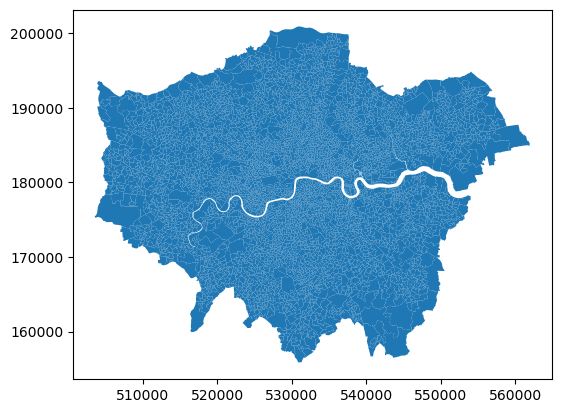

In [52]:
# load in the LSOA geometry Data
lsoa = gpd.read_file('lsoa_data.gpkg')
lsoa_ = lsoa[['lsoa_2021_code','geometry']]
lsoa_.info()
lsoa_.plot()

In [53]:
lsoa_['id'] = [str(i) for i in range(len(lsoa_))]
lsoa_['id'] = lsoa_['id'].astype(int)
lsoa_.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   lsoa_2021_code  4994 non-null   object  
 1   geometry        4994 non-null   geometry
 2   id              4994 non-null   int64   
dtypes: geometry(1), int64(1), object(1)
memory usage: 117.2+ KB


/Users/yujiama/anaconda3/envs/urbsim/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/yujiama/anaconda3/envs/urbsim/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [54]:
# load in the census data of LSOA
lsoa_data = pd.read_csv('lsoa.csv')
lsoa_ = lsoa_.merge(lsoa_data, left_on = 'lsoa_2021_code',right_on ='LSOA 2021 Code', how = "left")
lsoa_.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype   
---  ------               --------------  -----   
 0   lsoa_2021_code       4994 non-null   object  
 1   geometry             4994 non-null   geometry
 2   id                   4994 non-null   int64   
 3   LSOA 2021 Code       4994 non-null   object  
 4   LSOA 2021 Name       4994 non-null   object  
 5   Total_residents      4994 non-null   int64   
 6   female%              4994 non-null   float64 
 7   children%            4994 non-null   float64 
 8   elder%               4994 non-null   float64 
 9   minority_groups%     4994 non-null   float64 
 10  Buddhist%            4994 non-null   float64 
 11  Hindu%               4994 non-null   float64 
 12  Jewish%              4994 non-null   float64 
 13  Muslim%              4994 non-null   float64 
 14  Sikh%                4994 non-null   float64 
 15  Other religio

In [55]:
lsoa_acc_ga = lsoa_.merge(result_df_ga, on = 'id', how = 'left')
lsoa_acc_ga.head()

,lsoa_2021_code,geometry,id,LSOA 2021 Code,LSOA 2021 Name,Total_residents,female%,children%,elder%,minority_groups%,...,bad_heath%,disabled%,speakEng_notwell%,rent%,unemployed%,pop_density,total_open_space_m2,total_resi,nodes,Ga2SFCA_score
0,E01000001,"MULTIPOLYGON (((532151.538 181867.433, 532152....",0,E01000001,City of London 001A,1795,46.508475,8.018868,25.067385,44.195519,...,1.903467,10.340136,0.345543,42.467378,2.581121,0.013822,32551,1795,20460697,0.012460
1,E01000002,"MULTIPOLYGON (((532634.497 181926.016, 532632....",1,E01000002,City of London 001B,1671,43.858382,5.716353,20.115774,46.893064,...,2.244750,10.613718,0.366569,47.393939,2.459646,0.007315,40268,1671,748941508,0.008785
2,E01000003,"MULTIPOLYGON (((532153.703 182165.155, 532158....",2,E01000003,City of London 001C,1896,46.807192,6.679035,17.748918,49.440299,...,3.041589,13.639182,0.821226,62.857143,4.521277,0.032106,27272,1896,1155584130,0.005990
3,E01000005,"MULTIPOLYGON (((533619.062 181402.364, 533639....",3,E01000005,City of London 001E,1737,49.545455,11.748634,9.471767,76.539855,...,7.259528,17.122040,6.647940,91.286307,6.120332,0.009162,22753,1737,4715263992,5.310951
4,E01032739,"MULTIPOLYGON (((533376.156 181863.888, 533372....",4,E01032739,City of London 001F,2548,39.345275,4.277743,3.843769,65.228113,...,1.607916,7.204433,1.740211,75.170068,2.910737,0.001549,21407868,2548,2218344505,2.621635


In [56]:
max_ga2sfca_lsoa = lsoa_acc_ga.loc[lsoa_acc_ga['Ga2SFCA_score'].idxmax()]
print("highest Ga2SFCA LSOA:")
print(max_ga2sfca_lsoa)

highest Ga2SFCA LSOA:
lsoa_2021_code                                                 E01034033
geometry               MULTIPOLYGON (((517387 177546.199999999, 51738...
id                                                                  2788
LSOA 2021 Code                                                 E01034033
LSOA 2021 Name                                             Hounslow 006H
Total_residents                                                     1910
female%                                                         49.02968
children%                                                      15.393387
elder%                                                           6.95553
minority_groups%                                               62.634867
Buddhist%                                                       1.654307
Hindu%                                                          4.221335
Jewish%                                                         0.171135
Muslim%                      

In [57]:
#lsoa_acc_ga.to_file('lsoa_acc_ga.gpkg', driver='GPKG')
lsoa_acc_ga1 = lsoa_acc_ga.copy()

In [58]:
lsoa_acc_ga= lsoa_acc_ga.drop(columns = ['lsoa_2021_code','geometry',
       'LSOA 2021 Code', 'LSOA 2021 Name', 'Total_residents','nodes','id','total_resi'])
lsoa_acc_ga.columns

Index(['female%', 'children%', 'elder%', 'minority_groups%', 'Buddhist%',
       'Hindu%', 'Jewish%', 'Muslim%', 'Sikh%', 'Other religion%',
       'No_religion%', 'bad_heath%', 'disabled%', 'speakEng_notwell%', 'rent%',
       'unemployed%', 'pop_density', 'total_open_space_m2', 'Ga2SFCA_score'],
      dtype='object')

In [59]:
desc_stats = lsoa_acc_ga.describe()
desc_stats.loc['skew'] = lsoa_acc_ga.skew()
desc_stats.loc['kurtosis'] = lsoa_acc_ga.kurtosis()
print("Descriptive statistics, skew and kurtosis:")
print(desc_stats)
desc_stats.to_csv("lsoa_acc_ga_desc_stats.csv")

Descriptive statistics, skew and kurtosis:
              female%    children%       elder%  minority_groups%  \
count     4994.000000  4994.000000  4994.000000       4994.000000   
mean        51.534675    17.965091    12.122535         62.235982   
std          2.076084     4.320119     5.476400         18.833607   
min         30.223240     2.952261     0.260191          7.438017   
25%         50.396935    15.493849     8.382425         48.718054   
50%         51.592576    18.044069    11.114080         64.066011   
75%         52.777778    20.546482    15.201052         77.091047   
max         69.704142    41.058655    44.874275         99.457505   
skew        -0.785167     0.002904     0.825408         -0.354942   
kurtosis     7.676638     1.066066     1.062716         -0.601182   

            Buddhist%       Hindu%      Jewish%      Muslim%        Sikh%  \
count     4994.000000  4994.000000  4994.000000  4994.000000  4994.000000   
mean         0.876386     5.009147     1.69

In [60]:
lsoa_acc_ga.columns

Index(['female%', 'children%', 'elder%', 'minority_groups%', 'Buddhist%',
       'Hindu%', 'Jewish%', 'Muslim%', 'Sikh%', 'Other religion%',
       'No_religion%', 'bad_heath%', 'disabled%', 'speakEng_notwell%', 'rent%',
       'unemployed%', 'pop_density', 'total_open_space_m2', 'Ga2SFCA_score'],
      dtype='object')

# Variables Selection, Processing

In [61]:
import scipy.stats as stats
import statsmodels.api as sm
import seaborn as sns

In [62]:
cols = ['female%', 'children%', 'elder%', 'minority_groups%', 'Buddhist%',
       'Hindu%', 'Jewish%', 'Muslim%', 'Sikh%', 'Other religion%',
       'No_religion%', 'bad_heath%', 'disabled%', 'speakEng_notwell%', 'rent%',
       'unemployed%', 'pop_density', 'total_open_space_m2', 'Ga2SFCA_score']

In [63]:
df = lsoa_acc_ga[cols]

#### Data transformation and standardise for variables

In [64]:
from sklearn.preprocessing import PowerTransformer, StandardScaler

df_trans = df.copy()

transformed_cols = {}

for col in cols:
    X = df_trans[col].values.reshape(-1,1)
    if (df_trans[col] > 0).all():
        # positive variables → Box-Cox
        df_trans[col+'_log'] = np.log(X + 1)  # 加1避免log(0)
        transformed_cols[col] = 'Log'
    else:
        # negative or 0 variables → Yeo-Johnson
        pt = PowerTransformer(method='yeo-johnson', standardize=True)
        df_trans[col+'_yj'] = pt.fit_transform(X)
        transformed_cols[col] = 'Yeo-Johnson'
print(transformed_cols)

# Standardize the transformed variables
scaler = StandardScaler()
df_trans_std = pd.DataFrame(
    scaler.fit_transform(df_trans[[c for c in df_trans.columns if c.endswith(('_log', '_yj'))]]),
    columns = [c+'_std' for c in df_trans.columns if c.endswith(('_log', '_yj'))],
    index=df_trans.index
)

df = df_trans_std
df.columns

{'female%': 'Log', 'children%': 'Log', 'elder%': 'Log', 'minority_groups%': 'Log', 'Buddhist%': 'Yeo-Johnson', 'Hindu%': 'Yeo-Johnson', 'Jewish%': 'Yeo-Johnson', 'Muslim%': 'Log', 'Sikh%': 'Yeo-Johnson', 'Other religion%': 'Yeo-Johnson', 'No_religion%': 'Log', 'bad_heath%': 'Log', 'disabled%': 'Log', 'speakEng_notwell%': 'Yeo-Johnson', 'rent%': 'Log', 'unemployed%': 'Log', 'pop_density': 'Log', 'total_open_space_m2': 'Yeo-Johnson', 'Ga2SFCA_score': 'Yeo-Johnson'}


Index(['female%_log_std', 'children%_log_std', 'elder%_log_std',
       'minority_groups%_log_std', 'Buddhist%_yj_std', 'Hindu%_yj_std',
       'Jewish%_yj_std', 'Muslim%_log_std', 'Sikh%_yj_std',
       'Other religion%_yj_std', 'No_religion%_log_std', 'bad_heath%_log_std',
       'disabled%_log_std', 'speakEng_notwell%_yj_std', 'rent%_log_std',
       'unemployed%_log_std', 'pop_density_log_std',
       'total_open_space_m2_yj_std', 'Ga2SFCA_score_yj_std'],
      dtype='object')

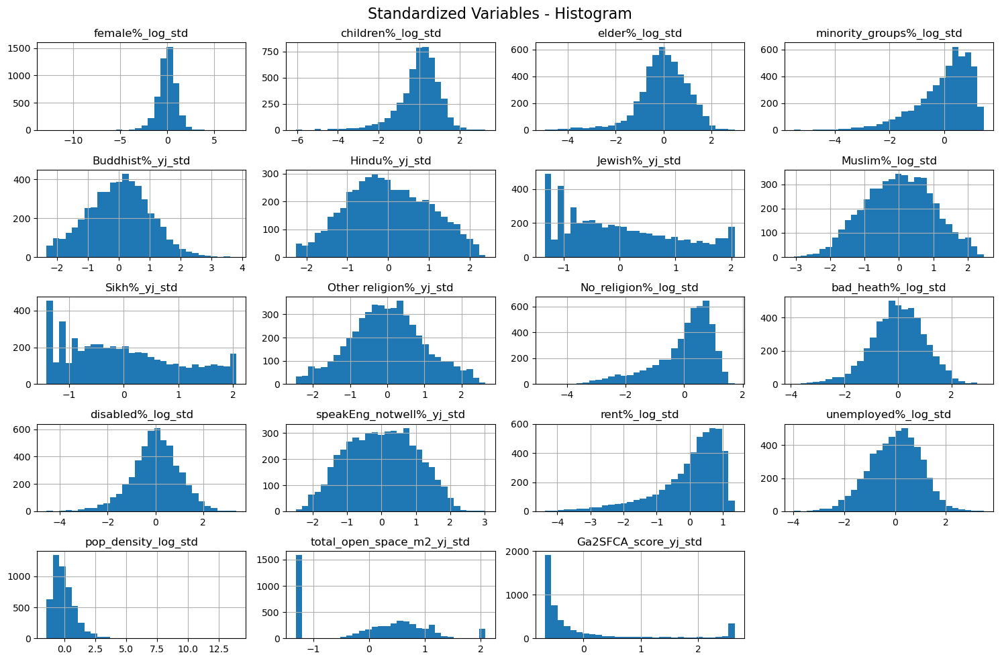

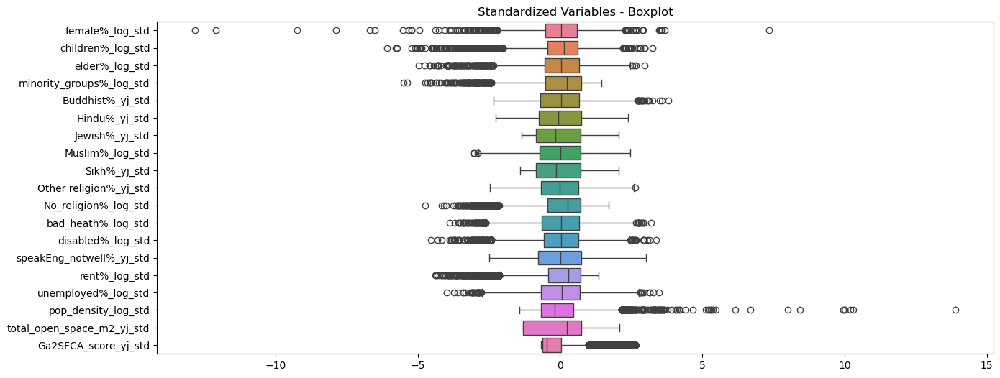

In [65]:
# 直方图
df.hist(figsize=(15, 10), bins=30)
plt.suptitle("Standardized Variables - Histogram", fontsize=16)
plt.tight_layout()
#plt.savefig("pics/histogram.png", dpi=300, bbox_inches='tight')
plt.show()

# 箱线图
plt.figure(figsize=(15, 6))
sns.boxplot(data=df, orient="h")
plt.title("Standardized Variables - Boxplot")
#plt.savefig("pics/boxplot.png", dpi=300, bbox_inches='tight')
plt.show()

In [66]:
df1 = df.copy()

In [67]:
df1['id'] = df1.index
df2 = df1[['id','Ga2SFCA_score_yj_std']]

In [68]:
df_gdf = lsoa_.merge(df1, on= 'id', how= 'left')
df_gdf = df_gdf[['id', 'geometry', 'female%_log_std', 'children%_log_std',
       'elder%_log_std', 'minority_groups%_log_std', 'Buddhist%_yj_std',
       'Hindu%_yj_std', 'Jewish%_yj_std', 'Muslim%_log_std', 'Sikh%_yj_std',
       'Other religion%_yj_std', 'No_religion%_log_std', 'bad_heath%_log_std',
       'disabled%_log_std', 'speakEng_notwell%_yj_std', 'rent%_log_std',
       'unemployed%_log_std', 'pop_density_log_std',
       'total_open_space_m2_yj_std', 'Ga2SFCA_score_yj_std']]
df_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   id                          4994 non-null   int64   
 1   geometry                    4994 non-null   geometry
 2   female%_log_std             4994 non-null   float64 
 3   children%_log_std           4994 non-null   float64 
 4   elder%_log_std              4994 non-null   float64 
 5   minority_groups%_log_std    4994 non-null   float64 
 6   Buddhist%_yj_std            4994 non-null   float64 
 7   Hindu%_yj_std               4994 non-null   float64 
 8   Jewish%_yj_std              4994 non-null   float64 
 9   Muslim%_log_std             4994 non-null   float64 
 10  Sikh%_yj_std                4994 non-null   float64 
 11  Other religion%_yj_std      4994 non-null   float64 
 12  No_religion%_log_std        4994 non-null   float64 
 13  bad_heath%

In [69]:
#df_gdf.to_file('variables_lsoa_std.gpkg', driver='GPKG')

In [70]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 2 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    4994 non-null   int64  
 1   Ga2SFCA_score_yj_std  4994 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 78.2 KB


In [71]:
lsoa_df = lsoa_.merge(df2, on= 'id', how= 'left')
lsoa_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   lsoa_2021_code        4994 non-null   object  
 1   geometry              4994 non-null   geometry
 2   id                    4994 non-null   int64   
 3   LSOA 2021 Code        4994 non-null   object  
 4   LSOA 2021 Name        4994 non-null   object  
 5   Total_residents       4994 non-null   int64   
 6   female%               4994 non-null   float64 
 7   children%             4994 non-null   float64 
 8   elder%                4994 non-null   float64 
 9   minority_groups%      4994 non-null   float64 
 10  Buddhist%             4994 non-null   float64 
 11  Hindu%                4994 non-null   float64 
 12  Jewish%               4994 non-null   float64 
 13  Muslim%               4994 non-null   float64 
 14  Sikh%                 4994 non-null   float64 
 

### accessibility plot

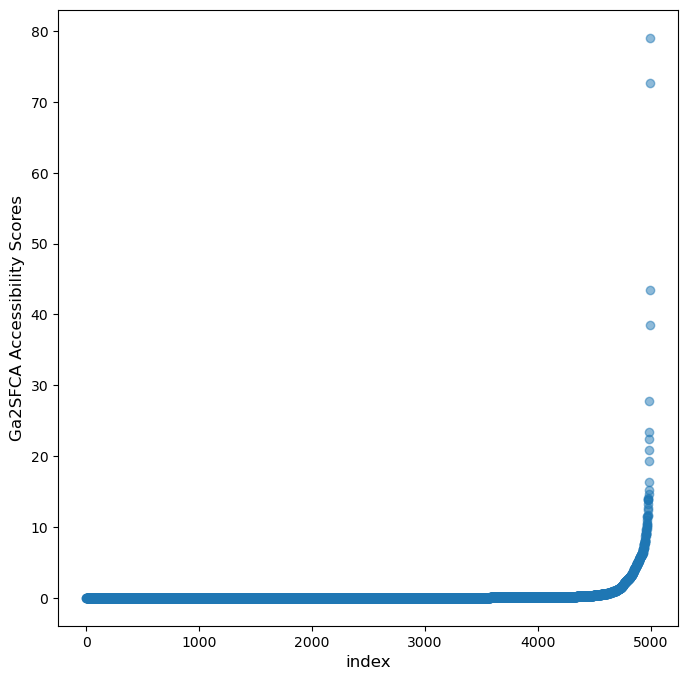

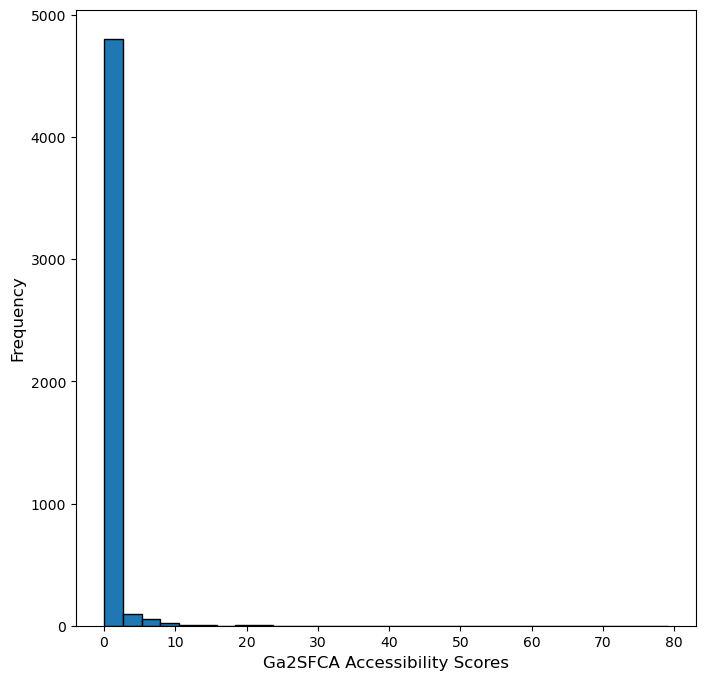

Skewness: 19.78
Kurtosis: 570.90


In [72]:
plt.figure(figsize=(8, 8))
plt.scatter(range(len(lsoa_acc_ga['Ga2SFCA_score'])), 
           sorted(lsoa_acc_ga['Ga2SFCA_score']),
           alpha=0.5)
plt.xlabel('index', fontsize=12)
plt.ylabel('Ga2SFCA Accessibility Scores', fontsize=12)
plt.savefig("pics/Ga2SFCA_scatter.png", dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(8, 8))
plt.hist(lsoa_acc_ga['Ga2SFCA_score'], bins=30, edgecolor='black')
plt.xlabel('Ga2SFCA Accessibility Scores', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.savefig("pics/Ga2SFCA_histogram.png", dpi=300, bbox_inches='tight')
plt.show()

import matplotlib.pyplot as plt
from scipy.stats import skew, kurtosis

sk = skew(lsoa_acc_ga['Ga2SFCA_score'])
kt = kurtosis(lsoa_acc_ga['Ga2SFCA_score'])

print(f"Skewness: {sk:.2f}")
print(f"Kurtosis: {kt:.2f}")

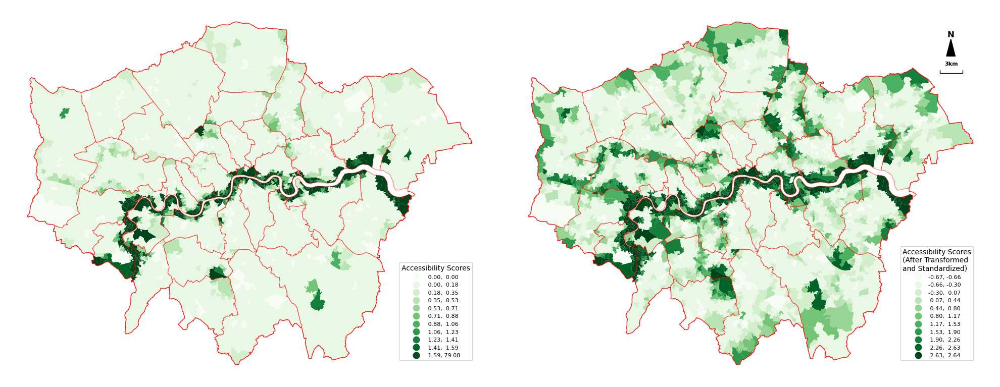

In [73]:
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

vmin1, vmax1 = lsoa_acc_ga['Ga2SFCA_score'].quantile([0.05, 0.95])
breaks1 = np.linspace(vmin1, vmax1, 10)

lsoa_acc_ga1.plot(
    column='Ga2SFCA_score',
    cmap='Greens',
    legend=True,
    scheme='user_defined',
    classification_kwds={'bins': breaks1},
    legend_kwds={'title': 'Accessibility Scores',
                'loc': 'lower left',
                'bbox_to_anchor': (0.8, 0.05),
                'fontsize': 8},ax=ax[0])

vmin, vmax = lsoa_df['Ga2SFCA_score_yj_std'].quantile([0.05, 0.95])
breaks = np.linspace(vmin, vmax, 10)

lsoa_df.plot(column='Ga2SFCA_score_yj_std',
              ax=ax[1], 
              cmap='Greens',
              legend=True,
              scheme='user_defined',
              classification_kwds={'bins': breaks},
              legend_kwds={'title': 'Accessibility Scores\n(After Transformed\nand Standardized)',
                         'loc': 'lower left',
                         'bbox_to_anchor': (0.8, 0.05),
                         'fontsize': 8})

LAD.plot(ax=ax[0], edgecolor='red', linewidth = 0.8, alpha=0.5, facecolor='none')
London.plot(edgecolor='red', linewidth = 1, alpha=0.8, facecolor='none',ax=ax[0])
LAD.plot(ax=ax[1], edgecolor='red', linewidth = 0.8, alpha=0.5, facecolor='none')
London.plot(edgecolor='red', linewidth = 1, alpha=0.8, facecolor='none',ax=ax[1])
add_north_arrow(ax[1], lsoa_df.total_bounds, fontsize=12)
add_scalebar(ax[1], lsoa_df.total_bounds, length=3000, label="3km", bar_height_ratio=0.01, x_offset=0.925, y_offset=0.85, lw=1, fontsize=8)

ax[0].axis('off')
ax[1].axis('off')

plt.tight_layout()
#plt.savefig("pics/Ga2SFCA_Accessibility_scores.png", dpi=300, bbox_inches='tight')
plt.show()

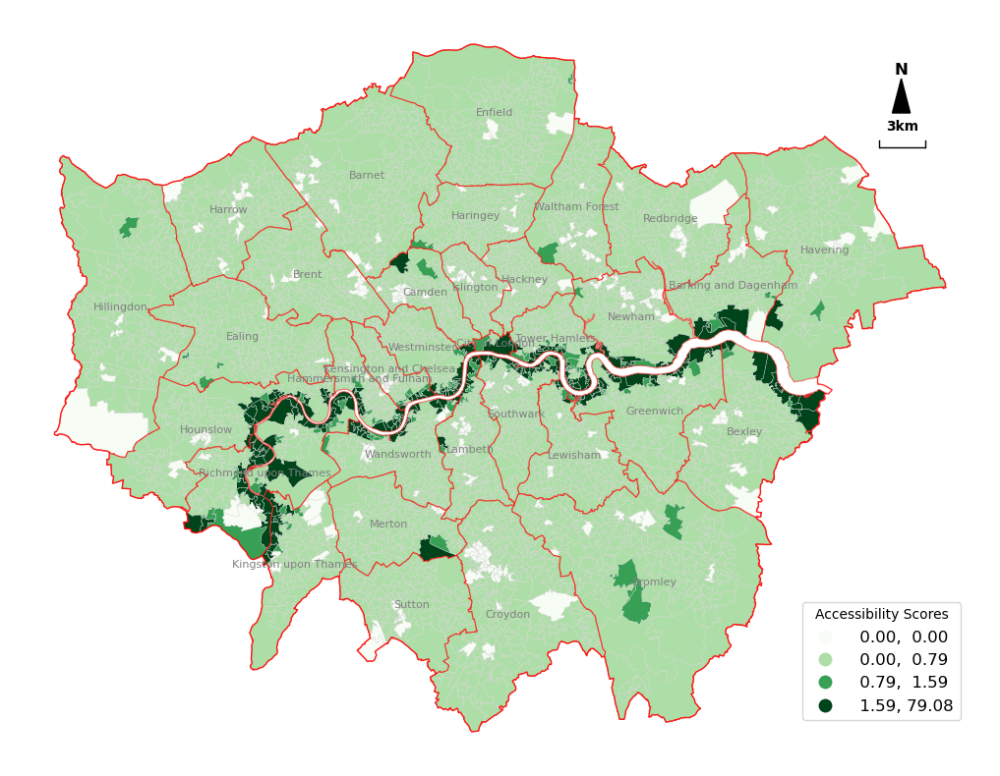

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8)) 

vmin1, vmax1 = lsoa_acc_ga['Ga2SFCA_score'].quantile([0.05, 0.95])
breaks1 = np.linspace(vmin1, vmax1, 3)

lsoa_acc_ga1.plot(
    column='Ga2SFCA_score',
    cmap='Greens',
    legend=True,
    scheme='user_defined',
    classification_kwds={'bins': breaks1},
    legend_kwds={'title': 'Accessibility Scores',
                'loc': 'lower left',
                'bbox_to_anchor': (0.8, 0.05),
                'fontsize': 12},ax=ax)
lsoa_.plot(ax=ax, color='none', edgecolor='lightgrey', linewidth = 0.2, alpha=0.9)
LAD.plot(ax=ax, edgecolor='red', linewidth = 0.8, alpha=0.5, facecolor='none')
London.plot(edgecolor='red', linewidth = 1, alpha=0.8, facecolor='none',ax=ax)
for idx, row in LAD.iterrows():
    centroid = row.geometry.centroid
    plt.text(centroid.x, centroid.y, 
             row['LAD24NM'],
             fontsize=8,
             ha='center', 
             va='center',
             fontweight='regular',
             color='grey')
add_north_arrow(ax, lsoa_df.total_bounds, fontsize=12)
add_scalebar(ax, lsoa_df.total_bounds, length=3000, label="3km", bar_height_ratio=0.01, x_offset=0.925, y_offset=0.85, lw=1, fontsize=10)

ax.axis('off')
plt.tight_layout()
#plt.savefig("pics/Ga2SFCA_access_scores.png", dpi=300, bbox_inches='tight')
plt.show()

In [78]:
# sort the LSOA by Ga2SFCA_score from high to low and show the top 30 LSOA
print("highest 30 LSOA:")
print(lsoa_acc_ga1[['LSOA 2021 Name', 'Ga2SFCA_score']].sort_values(by='Ga2SFCA_score', ascending=False).head(30))

print("lowest 30 LSOA:")
print(lsoa_acc_ga1[['LSOA 2021 Name', 'Ga2SFCA_score']].sort_values(by='Ga2SFCA_score', ascending=True).head(30))

highest 30 LSOA:
                 LSOA 2021 Name  Ga2SFCA_score
2788              Hounslow 006H      79.081439
2773              Hounslow 006E      72.703013
2772              Hounslow 014D      43.399831
2784              Hounslow 031C      38.453873
485                 Bexley 008H      27.777364
119   Barking and Dagenham 019I      23.448480
443                 Bexley 008B      22.396434
118   Barking and Dagenham 019H      20.864484
1741             Greenwich 002E      19.285781
4978           Westminster 023F      16.382894
2783              Hounslow 031D      15.223430
2799              Hounslow 030C      14.638411
3996  Richmond upon Thames 022A      14.104502
481                 Bexley 001C      13.988903
3770                Newham 033G      13.741665
2664              Hounslow 001A      13.730508
2798              Hounslow 030B      13.214734
419                 Bexley 004C      12.691619
3734                Newham 041C      12.414666
444                 Bexley 008C      11.641

### Correlation Matrix

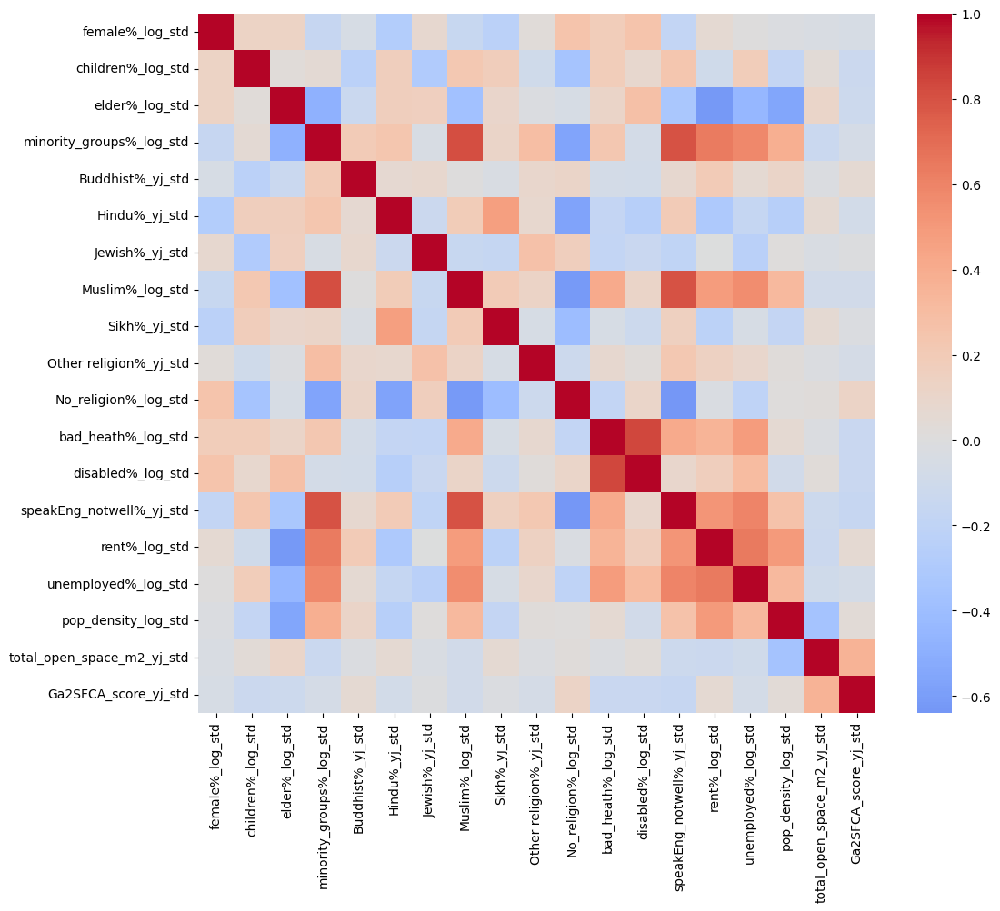

In [79]:
plt.figure(figsize=(12,10))
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm', center=0, annot=False)
#plt.title("Correlation Matrix of Standardized Variables")
#plt.savefig("pics/correlation_matrix.png", dpi=300, bbox_inches='tight')
plt.show()

In [80]:
lsoa_df.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   lsoa_2021_code        4994 non-null   object  
 1   geometry              4994 non-null   geometry
 2   id                    4994 non-null   int64   
 3   LSOA 2021 Code        4994 non-null   object  
 4   LSOA 2021 Name        4994 non-null   object  
 5   Total_residents       4994 non-null   int64   
 6   female%               4994 non-null   float64 
 7   children%             4994 non-null   float64 
 8   elder%                4994 non-null   float64 
 9   minority_groups%      4994 non-null   float64 
 10  Buddhist%             4994 non-null   float64 
 11  Hindu%                4994 non-null   float64 
 12  Jewish%               4994 non-null   float64 
 13  Muslim%               4994 non-null   float64 
 14  Sikh%                 4994 non-null   float64 
 

### Pearson coeffient 

Pearson correlation coefficient with Ga2SFCA_score_yj_std:
Ga2SFCA_score_yj_std          1.000000
total_open_space_m2_yj_std    0.364463
No_religion%_log_std          0.120139
rent%_log_std                 0.056316
Buddhist%_yj_std              0.053326
pop_density_log_std           0.033826
Jewish%_yj_std               -0.007521
Sikh%_yj_std                 -0.017227
female%_log_std              -0.052945
Other religion%_yj_std       -0.065715
minority_groups%_log_std     -0.068238
unemployed%_log_std          -0.072765
Hindu%_yj_std                -0.077332
Muslim%_log_std              -0.086530
elder%_log_std               -0.116665
children%_log_std            -0.130514
disabled%_log_std            -0.144734
bad_heath%_log_std           -0.145536
speakEng_notwell%_yj_std     -0.162541
Name: Ga2SFCA_score_yj_std, dtype: float64


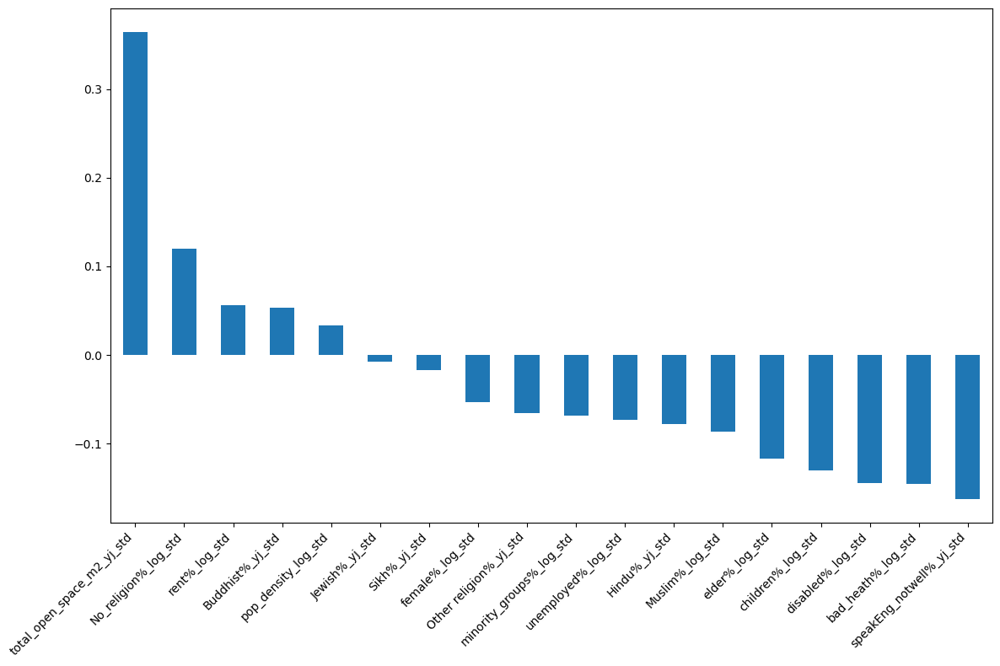

In [81]:
# calculate the Pearson correlation coefficient
corr_matrix = df.corr(method='pearson')

target_corr = corr_matrix['Ga2SFCA_score_yj_std'].sort_values(ascending=False)

print("Pearson correlation coefficient with Ga2SFCA_score_yj_std:")
print(target_corr)

plt.figure(figsize=(12,8))
target_corr[1:].plot(kind='bar') 
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Modelling

### Baseline model: OLS 

In [82]:
# set the dependent variable and independent variables
y = df['Ga2SFCA_score_yj_std']
X = df.drop(columns=['Ga2SFCA_score_yj_std'])
# add the intercept term
X_const = sm.add_constant(X)
# fit the model
model_ga2sfca = sm.OLS(y, X_const).fit()
# view the results
print(model_ga2sfca.summary())

                             OLS Regression Results                             
Dep. Variable:     Ga2SFCA_score_yj_std   R-squared:                       0.240
Model:                              OLS   Adj. R-squared:                  0.237
Method:                   Least Squares   F-statistic:                     87.14
Date:                  Mon, 11 Aug 2025   Prob (F-statistic):          3.60e-279
Time:                          15:07:14   Log-Likelihood:                -6401.9
No. Observations:                  4994   AIC:                         1.284e+04
Df Residuals:                      4975   BIC:                         1.297e+04
Df Model:                            18                                         
Covariance Type:              nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------


In [83]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame({
    "variable": X_const.columns,
    "VIF": [variance_inflation_factor(X_const.values, i) for i in range(X_const.shape[1])]
})
display(vif)

#vif.to_csv('vif.csv', index=False, encoding='utf-8-sig')

,variable,VIF
0,const,1.000000
1,female%_log_std,1.334051
2,children%_log_std,1.617103
3,elder%_log_std,3.560764
4,minority_groups%_log_std,7.988651
5,Buddhist%_yj_std,1.243437
6,Hindu%_yj_std,2.411250
7,Jewish%_yj_std,1.487651
8,Muslim%_log_std,4.932865
9,Sikh%_yj_std,1.423675


### Global Moran's I

In [84]:
df['id'] = range(len(df))

In [85]:
lsoa1 = lsoa_[['id','geometry']]
moranI_ga2sfca =lsoa1.merge(df, on = 'id', how = 'left')
moranI_ga2sfca.head()

,id,geometry,female%_log_std,children%_log_std,elder%_log_std,minority_groups%_log_std,Buddhist%_yj_std,Hindu%_yj_std,Jewish%_yj_std,Muslim%_log_std,...,Other religion%_yj_std,No_religion%_log_std,bad_heath%_log_std,disabled%_log_std,speakEng_notwell%_yj_std,rent%_log_std,unemployed%_log_std,pop_density_log_std,total_open_space_m2_yj_std,Ga2SFCA_score_yj_std
0,0,"MULTIPOLYGON (((532151.538 181867.433, 532152....",-2.463871,-2.816887,1.716931,-0.786474,-0.112070,-0.005052,1.338161,-1.770601,...,-0.931536,1.233142,-1.740902,-0.916728,-1.983629,-0.151613,-1.112561,0.458440,0.356338,-0.425353
1,1,"MULTIPOLYGON (((532634.497 181926.016, 532632....",-3.881470,-3.979872,1.252814,-0.623950,-0.019379,-0.543551,1.497593,-1.900242,...,-0.859616,1.262682,-1.385925,-0.809607,-1.956920,0.048029,-1.237509,-0.434997,0.401150,-0.495482
2,2,"MULTIPOLYGON (((532153.703 182165.155, 532158....",-2.309066,-3.451397,0.990899,-0.478675,0.256732,-0.823392,1.527591,-1.423990,...,-0.825965,1.219823,-0.684486,0.230718,-1.462151,0.563617,0.454959,2.938735,0.319456,-0.550066
3,3,"MULTIPOLYGON (((533619.062 181402.364, 533639....",-0.933471,-1.451380,-0.292308,0.726820,-0.204973,-0.584817,1.001810,1.340914,...,-0.352678,-0.167808,1.598483,1.189766,1.011034,1.248370,1.375866,-0.180794,0.282056,2.635092
4,4,"MULTIPOLYGON (((533376.156 181863.888, 533372....",-6.500336,-4.930885,-1.990881,0.284750,1.471405,0.500227,1.400608,-1.429025,...,1.008140,1.031490,-2.083810,-2.371175,-0.758243,0.891483,-0.793758,-1.231585,1.982322,2.634037


In [86]:
# ── 2.2 build the spatial weight matrix ──
# Queen adjacency (shared edges or vertices are neighbors)
w = Queen.from_dataframe(moranI_ga2sfca, idVariable="id")
w.transform = 'r'

ols = OLS(y, X)

# ── 2.3 calculate the global Moran I ──
moran = Moran(ols.u, w)
print(f"\n\n residual Moran's I = {moran.I:.4f}, p-value = {moran.p_sim:.4f}\n\n")

/var/folders/tb/wy2rpw290nggll97xqwblz240000gn/T/ipykernel_43012/3992247656.py:3: FutureWarning: `idVariable` is deprecated and will be removed in future. Use `ids` instead.
  w = Queen.from_dataframe(moranI_ga2sfca, idVariable="id")




 residual Moran's I = 0.5229, p-value = 0.0010




### Local Moran's I plot

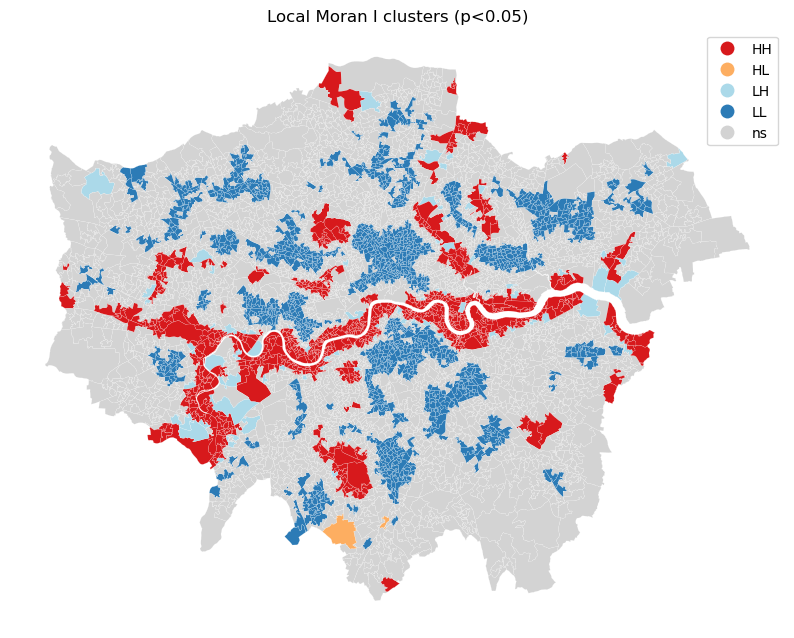

In [87]:
ml = Moran_Local(moranI_ga2sfca['Ga2SFCA_score_yj_std'], w)

# 显著性掩膜（p < 0.05）
moranI_ga2sfca['cluster'] = ml.q
moranI_ga2sfca['sig']     = ml.p_sim < 0.05

# 绘图
fig, ax = plt.subplots(figsize=(10,8))
lisa_cluster(ml, moranI_ga2sfca, p=0.05, ax=ax, legend=True)
ax.set_title('Local Moran I clusters (p<0.05)')
plt.show()

### GWR and MGWR model

In [88]:
from shapely import wkt

orig['geometry'] = orig['geometry'].apply(wkt.loads)

orig2 = gpd.GeoDataFrame(orig[['id', 'geometry']], geometry='geometry')

orig2.set_crs(epsg=27700, inplace=True)
orig2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   id        4994 non-null   int64   
 1   geometry  4994 non-null   geometry
dtypes: geometry(1), int64(1)
memory usage: 78.2 KB


#### GWR model

In [89]:
gwr_ga = orig2.merge(df, on = 'id', how = 'left')
print(gwr_ga.columns)
gwr_ga.head()

Index(['id', 'geometry', 'female%_log_std', 'children%_log_std',
       'elder%_log_std', 'minority_groups%_log_std', 'Buddhist%_yj_std',
       'Hindu%_yj_std', 'Jewish%_yj_std', 'Muslim%_log_std', 'Sikh%_yj_std',
       'Other religion%_yj_std', 'No_religion%_log_std', 'bad_heath%_log_std',
       'disabled%_log_std', 'speakEng_notwell%_yj_std', 'rent%_log_std',
       'unemployed%_log_std', 'pop_density_log_std',
       'total_open_space_m2_yj_std', 'Ga2SFCA_score_yj_std'],
      dtype='object')


,id,geometry,female%_log_std,children%_log_std,elder%_log_std,minority_groups%_log_std,Buddhist%_yj_std,Hindu%_yj_std,Jewish%_yj_std,Muslim%_log_std,...,Other religion%_yj_std,No_religion%_log_std,bad_heath%_log_std,disabled%_log_std,speakEng_notwell%_yj_std,rent%_log_std,unemployed%_log_std,pop_density_log_std,total_open_space_m2_yj_std,Ga2SFCA_score_yj_std
0,0,POINT (532149.055 181617.231),-2.463871,-2.816887,1.716931,-0.786474,-0.112070,-0.005052,1.338161,-1.770601,...,-0.931536,1.233142,-1.740902,-0.916728,-1.983629,-0.151613,-1.112561,0.458440,0.356338,-0.425353
1,1,POINT (532441.582 181643.376),-3.881470,-3.979872,1.252814,-0.623950,-0.019379,-0.543551,1.497593,-1.900242,...,-0.859616,1.262682,-1.385925,-0.809607,-1.956920,0.048029,-1.237509,-0.434997,0.401150,-0.495482
2,2,POINT (532203.754 182029.807),-2.309066,-3.451397,0.990899,-0.478675,0.256732,-0.823392,1.527591,-1.423990,...,-0.825965,1.219823,-0.684486,0.230718,-1.462151,0.563617,0.454959,2.938735,0.319456,-0.550066
3,3,POINT (533618.236 181152.644),-0.933471,-1.451380,-0.292308,0.726820,-0.204973,-0.584817,1.001810,1.340914,...,-0.352678,-0.167808,1.598483,1.189766,1.011034,1.248370,1.375866,-0.180794,0.282056,2.635092
4,4,POINT (532768.862 181159.419),-6.500336,-4.930885,-1.990881,0.284750,1.471405,0.500227,1.400608,-1.429025,...,1.008140,1.031490,-2.083810,-2.371175,-0.758243,0.891483,-0.793758,-1.231585,1.982322,2.634037


In [ ]:
#gwr_ga.to_file("gwr_ga.gpkg", driver="GPKG")

In [91]:
gwr_ga = gpd.read_file('mgwr/gwr_ga.gpkg')

In [56]:
# 1. extract the data
y_var = 'Ga2SFCA_score_yj_std'
x_vars = ['female%_log_std', 'children%_log_std',
       'elder%_log_std', 'minority_groups%_log_std', 'Buddhist%_yj_std',
       'Hindu%_yj_std', 'Jewish%_yj_std', 'Muslim%_log_std', 'Sikh%_yj_std',
       'Other religion%_yj_std', 'No_religion%_log_std', 'bad_heath%_log_std',
       'disabled%_log_std', 'speakEng_notwell%_yj_std', 'rent%_log_std',
       'unemployed%_log_std', 'pop_density_log_std',
       'total_open_space_m2_yj_std']

coords = np.column_stack([gwr_ga.geometry.x, gwr_ga.geometry.y])

y = gwr_ga[[y_var]].values
X = gwr_ga[x_vars].values

# 2. select the bandwidth
bw1 = Sel_BW(coords, y, X).search(bw_min=2)

print(f"Optimal bandwidth: {bw1}")

# 3. run GWR
gwr_model = GWR(coords, y, X, bw1)
gwr_results = gwr_model.fit()

# 4. output the results
print(gwr_results.summary())

Optimal bandwidth: 284.0
Model type                                                         Gaussian
Number of observations:                                                4994
Number of covariates:                                                    19

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                           3796.931
Log-likelihood:                                                   -6401.891
AIC:                                                              12841.782
AICc:                                                             12843.951
BIC:                                                             -38570.131
R2:                                                                   0.240
Adj. R2:                                                              0.237

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---

In [57]:
# 5. save the results
params = gwr_results.params
params_df = pd.DataFrame(
    params,
    columns=['Intercept'] + x_vars)
params_df['geometry'] = gwr_ga.geometry.values
gwr_ga1 = gpd.GeoDataFrame(params_df, geometry='geometry', crs=gwr_ga.crs)

#### MGWR model

In [92]:
gwr_ga = gpd.read_file('mgwr/gwr_ga.gpkg')
print(gwr_ga.info())

y_var = 'Ga2SFCA_score_yj_std'
x_vars = ['female%_log_std', 'children%_log_std','elder%_log_std', 'minority_groups%_log_std', 
'Buddhist%_yj_std', 'Hindu%_yj_std', 'Jewish%_yj_std', 'Muslim%_log_std', 
'Sikh%_yj_std','Other religion%_yj_std', 'No_religion%_log_std', 'bad_heath%_log_std',
'disabled%_log_std', 'speakEng_notwell%_yj_std', 'rent%_log_std', 'unemployed%_log_std', 
'pop_density_log_std','total_open_space_m2_yj_std']

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   id                          4994 non-null   int64   
 1   female%_log_std             4994 non-null   float64 
 2   children%_log_std           4994 non-null   float64 
 3   elder%_log_std              4994 non-null   float64 
 4   minority_groups%_log_std    4994 non-null   float64 
 5   Buddhist%_yj_std            4994 non-null   float64 
 6   Hindu%_yj_std               4994 non-null   float64 
 7   Jewish%_yj_std              4994 non-null   float64 
 8   Muslim%_log_std             4994 non-null   float64 
 9   Sikh%_yj_std                4994 non-null   float64 
 10  Other religion%_yj_std      4994 non-null   float64 
 11  No_religion%_log_std        4994 non-null   float64 
 12  bad_heath%_log_std          4994 non-null   float64 
 13  disabled%_

In [93]:
"""
gdf = gwr_ga.copy()
coords = np.column_stack([gdf.geometry.x, gdf.geometry.y])

y = gdf[[y_var]].values
X = gdf[x_vars].values

selector = Sel_BW(coords, y, X, multi=True)
bw = selector.search()
print(f"Optimal bandwidths for each variable: {bw}")

mgwr_model = MGWR(coords, y, X, selector=selector).fit()
print(mgwr_model.summary())
"""
# calculation time: 200 mins

'\ngdf = gwr_ga.copy()\ncoords = np.column_stack([gdf.geometry.x, gdf.geometry.y])\n\ny = gdf[[y_var]].values\nX = gdf[x_vars].values\n\nselector = Sel_BW(coords, y, X, multi=True)\nbw = selector.search()\nprint(f"Optimal bandwidths for each variable: {bw}")\n\nmgwr_model = MGWR(coords, y, X, selector=selector).fit()\nprint(mgwr_model.summary())\n'

##### Optimal bandwidths for each variable: 
[ 44. 4992. 4988.  161.   44. 3370. 4992. 4992. 4992. 4221. 4988.   44. 4992.  487. 4992.  145. 4482.  790.   63.]

##### Model results: 

Model type                                                         Gaussian

Number of observations:                                                4994

Number of covariates:                                                    19

##### Global Regression Results

Residual sum of squares:                                           3796.931

Log-likelihood:                                                   -6401.891

AIC:                                                              12841.782

AICc:                                                             12843.951

BIC:                                                             -38570.131

R2:                                                                   0.240

Adj. R2:                                                              0.237

|Variable                              |Est.         |SE  |t(Est/SE)    |p-value|
|------------------------------- |---------- |---------- |---------- |----------|
|X0                                  | 0.000     | 0.012     | 0.000     | 1.000|
|X1                                  |-0.035     | 0.014     |-2.436     | 0.015|
|X2                                  |-0.070     | 0.016     |-4.422     | 0.000|
|X3                                  | 0.010     | 0.023     | 0.425     | 0.671|
|X4                                  |-0.097     | 0.035     |-2.790     | 0.005|
|X5                                  | 0.029     | 0.014     | 2.077     | 0.038|
|X6                                  |-0.051     | 0.019     |-2.668     | 0.008|
|X7                                  |-0.083     | 0.015     |-5.509     | 0.000|
|X8                                  | 0.078     | 0.027     | 2.852     | 0.004|
|X9                                  | 0.032     | 0.015     | 2.192     | 0.028|
|X10                                 |-0.001     | 0.014     |-0.099     | 0.921|
|X11                                 |-0.065     | 0.026     |-2.529     | 0.011|
|X12                                 | 0.030     | 0.031     | 0.973     | 0.330|
|X13                                 |-0.192     | 0.029     |-6.582     | 0.000|
|X14                                 |-0.265     | 0.027     |-9.906     | 0.000|
|X15                                 | 0.243     | 0.026     | 9.494     | 0.000|
|X16                                 |-0.037     | 0.020     |-1.845     | 0.065|
|X17                                 | 0.114     | 0.017     | 6.565     | 0.000|
|X18                                 | 0.399     | 0.014     |29.576     | 0.000|

##### Multi-Scale Geographically Weighted Regression (MGWR) Results

Spatial kernel:                                           Adaptive bisquare

Criterion for optimal bandwidth:                                       AICc

Score of Change (SOC) type:                                     Smoothing f

Termination criterion for MGWR:                                       1e-05

###### MGWR bandwidths

|Variable             |Bandwidth      |ENP_j   |Adj t-val(95%)   |Adj alpha(95%) |
|-------------------- |---------- |---------- |---------- |----------|
|X0                   |   44.000   | 202.203   |         3.668   |         0.000|
|X1                   | 4992.000   |   1.284   |         2.065   |         0.039|
|X2                   | 4988.000   |   1.122   |         2.009   |         0.045|
|X3                   |  161.000   |  54.097   |         3.315   |         0.001|
|X4                   |   44.000   | 205.588   |         3.672   |         0.000|
|X5                   | 3370.000   |   2.879   |         2.380   |         0.017|
|X6                   | 4992.000   |   1.084   |         1.995   |         0.046|
|X7                   | 4992.000   |   1.149   |         2.019   |         0.044|
|X8                   | 4992.000   |   1.053   |         1.983   |         0.047|
|X9                   | 4221.000   |   1.707   |         2.180   |         0.029|
|X10                  | 4988.000   |   1.347   |         2.085   |         0.037|
|X11                  |   44.000   | 202.156   |         3.668   |         0.000|
|X12                  | 4992.000   |   1.100   |         2.001   |         0.045|
|X13                  |  487.000   |  17.842   |         2.990   |         0.003|
|X14                  | 4992.000   |   1.071   |         1.990   |         0.047|
|X15                  |  145.000   |  51.599   |         3.301   |         0.001|
|X16                  | 4482.000   |   1.483   |         2.124   |         0.034|
|X17                  |  790.000   |   8.596   |         2.759   |         0.006|
|X18                  |   63.000   | 196.145   |         3.660   |         0.000|

##### Diagnostic information

Residual sum of squares:                                           1065.283

Effective number of parameters (trace(S)):                          953.507

Degree of freedom (n - trace(S)):                                  4040.493

Sigma estimate:                                                       0.513

Log-likelihood:                                                   -3228.322

AIC:                                                               8365.659

AICc:                                                              8817.331

BIC:                                                              14585.220

R2                                                                    0.787

Adjusted R2                                                           0.736

##### Summary Statistics For MGWR Parameter Estimates

|Variable             |      Mean |       STD |       Min |    Median |       Max|
|-------------------- |---------- |---------- |---------- |---------- |----------|
|X0                   |    -0.112 |     0.416 |    -0.643 |    -0.233 |     1.880|
|X1                   |    -0.008 |     0.001 |    -0.009 |    -0.008 |    -0.006|
|X2                   |    -0.043 |     0.002 |    -0.045 |    -0.044 |    -0.038|
|X3                   |    -0.058 |     0.134 |    -0.417 |    -0.050 |     0.502|
|X4                   |    -0.200 |     0.405 |    -1.766 |    -0.180 |     1.000|
|X5                   |     0.019 |     0.014 |    -0.015 |     0.022 |     0.041|
|X6                   |    -0.029 |     0.002 |    -0.033 |    -0.029 |    -0.025|
|X7                   |     0.001 |     0.003 |    -0.007 |     0.001 |     0.005|
|X8                   |     0.055 |     0.001 |     0.052 |     0.055 |     0.058|
|X9                   |     0.005 |     0.013 |    -0.007 |    -0.000 |     0.031|
|X10                  |     0.023 |     0.004 |     0.015 |     0.023 |     0.029|
|X11                  |    -0.072 |     0.359 |    -1.290 |    -0.084 |     1.732|
|X12                  |     0.047 |     0.002 |     0.043 |     0.047 |     0.051|
|X13                  |    -0.044 |     0.039 |    -0.213 |    -0.043 |     0.049|
|X14                  |    -0.050 |     0.001 |    -0.053 |    -0.050 |    -0.047|
|X15                  |     0.069 |     0.172 |    -0.228 |     0.024 |     0.859|
|X16                  |    -0.001 |     0.009 |    -0.019 |     0.001 |     0.011|
|X17                  |    -0.002 |     0.059 |    -0.178 |    -0.010 |     0.156|
|X18                  |     0.171 |     0.140 |    -0.083 |     0.135 |     0.870|


In [ ]:
#params = mgwr_model.params

#for i, var in enumerate(['Intercept'] + x_vars):
#    gdf[f'{var}_mgwr'] = params[:, i]

In [94]:
gdf = gpd.read_file('mgwr_result.gpkg')
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   id                               4994 non-null   int64   
 1   Intercept_mgwr                   4994 non-null   float64 
 2   female%_log_std_mgwr             4994 non-null   float64 
 3   children%_log_std_mgwr           4994 non-null   float64 
 4   elder%_log_std_mgwr              4994 non-null   float64 
 5   minority_groups%_log_std_mgwr    4994 non-null   float64 
 6   Buddhist%_yj_std_mgwr            4994 non-null   float64 
 7   Hindu%_yj_std_mgwr               4994 non-null   float64 
 8   Jewish%_yj_std_mgwr              4994 non-null   float64 
 9   Muslim%_log_std_mgwr             4994 non-null   float64 
 10  Sikh%_yj_std_mgwr                4994 non-null   float64 
 11  Other religion%_yj_std_mgwr      4994 non-null   float64 
 12

In [95]:
gdf = gdf[['id','geometry',
       'Intercept_mgwr', 'female%_log_std_mgwr', 'children%_log_std_mgwr',
       'elder%_log_std_mgwr', 'minority_groups%_log_std_mgwr',
       'Buddhist%_yj_std_mgwr', 'Hindu%_yj_std_mgwr', 'Jewish%_yj_std_mgwr',
       'Muslim%_log_std_mgwr', 'Sikh%_yj_std_mgwr',
       'Other religion%_yj_std_mgwr', 'No_religion%_log_std_mgwr',
       'bad_heath%_log_std_mgwr', 'disabled%_log_std_mgwr',
       'speakEng_notwell%_yj_std_mgwr', 'rent%_log_std_mgwr',
       'unemployed%_log_std_mgwr', 'pop_density_log_std_mgwr',
       'total_open_space_m2_yj_std_mgwr']]

In [96]:
type(gdf)

geopandas.geodataframe.GeoDataFrame

In [97]:
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 21 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   id                               4994 non-null   int64   
 1   geometry                         4994 non-null   geometry
 2   Intercept_mgwr                   4994 non-null   float64 
 3   female%_log_std_mgwr             4994 non-null   float64 
 4   children%_log_std_mgwr           4994 non-null   float64 
 5   elder%_log_std_mgwr              4994 non-null   float64 
 6   minority_groups%_log_std_mgwr    4994 non-null   float64 
 7   Buddhist%_yj_std_mgwr            4994 non-null   float64 
 8   Hindu%_yj_std_mgwr               4994 non-null   float64 
 9   Jewish%_yj_std_mgwr              4994 non-null   float64 
 10  Muslim%_log_std_mgwr             4994 non-null   float64 
 11  Sikh%_yj_std_mgwr                4994 non-null   float64 
 12

In [98]:
gdf.columns

Index(['id', 'geometry', 'Intercept_mgwr', 'female%_log_std_mgwr',
       'children%_log_std_mgwr', 'elder%_log_std_mgwr',
       'minority_groups%_log_std_mgwr', 'Buddhist%_yj_std_mgwr',
       'Hindu%_yj_std_mgwr', 'Jewish%_yj_std_mgwr', 'Muslim%_log_std_mgwr',
       'Sikh%_yj_std_mgwr', 'Other religion%_yj_std_mgwr',
       'No_religion%_log_std_mgwr', 'bad_heath%_log_std_mgwr',
       'disabled%_log_std_mgwr', 'speakEng_notwell%_yj_std_mgwr',
       'rent%_log_std_mgwr', 'unemployed%_log_std_mgwr',
       'pop_density_log_std_mgwr', 'total_open_space_m2_yj_std_mgwr'],
      dtype='object')

In [99]:
gdf1 = gdf.drop(columns=['geometry'])

In [100]:
gdf2 = lsoa_.merge(gdf1, on = 'id', how = 'left')
type(gdf2)

geopandas.geodataframe.GeoDataFrame

In [101]:
gdf2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 4994 entries, 0 to 4993
Data columns (total 43 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   lsoa_2021_code                   4994 non-null   object  
 1   geometry                         4994 non-null   geometry
 2   id                               4994 non-null   int64   
 3   LSOA 2021 Code                   4994 non-null   object  
 4   LSOA 2021 Name                   4994 non-null   object  
 5   Total_residents                  4994 non-null   int64   
 6   female%                          4994 non-null   float64 
 7   children%                        4994 non-null   float64 
 8   elder%                           4994 non-null   float64 
 9   minority_groups%                 4994 non-null   float64 
 10  Buddhist%                        4994 non-null   float64 
 11  Hindu%                           4994 non-null   float64 
 12

In [102]:
gdf2 = gdf2[['id', 'geometry', 'Intercept_mgwr', 'female%_log_std_mgwr',
       'children%_log_std_mgwr', 'elder%_log_std_mgwr',
       'minority_groups%_log_std_mgwr', 'Buddhist%_yj_std_mgwr',
       'Hindu%_yj_std_mgwr', 'Jewish%_yj_std_mgwr', 'Muslim%_log_std_mgwr',
       'Sikh%_yj_std_mgwr', 'Other religion%_yj_std_mgwr',
       'No_religion%_log_std_mgwr', 'bad_heath%_log_std_mgwr',
       'disabled%_log_std_mgwr', 'speakEng_notwell%_yj_std_mgwr',
       'rent%_log_std_mgwr', 'unemployed%_log_std_mgwr',
       'pop_density_log_std_mgwr', 'total_open_space_m2_yj_std_mgwr']]

In [103]:
gdf2.head()

,id,geometry,Intercept_mgwr,female%_log_std_mgwr,children%_log_std_mgwr,elder%_log_std_mgwr,minority_groups%_log_std_mgwr,Buddhist%_yj_std_mgwr,Hindu%_yj_std_mgwr,Jewish%_yj_std_mgwr,...,Sikh%_yj_std_mgwr,Other religion%_yj_std_mgwr,No_religion%_log_std_mgwr,bad_heath%_log_std_mgwr,disabled%_log_std_mgwr,speakEng_notwell%_yj_std_mgwr,rent%_log_std_mgwr,unemployed%_log_std_mgwr,pop_density_log_std_mgwr,total_open_space_m2_yj_std_mgwr
0,0,"MULTIPOLYGON (((532151.538 181867.433, 532152....",-0.326948,-0.009312,-0.043973,-0.212009,-0.261822,0.031309,-0.029711,0.002051,...,-0.002003,0.023607,-0.212261,0.046855,-0.043898,-0.048319,0.429920,0.003183,-0.012877,0.504316
1,1,"MULTIPOLYGON (((532634.497 181926.016, 532632....",-0.268630,-0.009253,-0.043818,-0.211999,-0.482097,0.030462,-0.029811,0.001965,...,-0.002431,0.023395,-0.285374,0.046920,-0.047269,-0.048363,0.454909,0.003554,-0.013885,0.469596
2,2,"MULTIPOLYGON (((532153.703 182165.155, 532158....",-0.451328,-0.009314,-0.043894,-0.190962,-0.422736,0.030842,-0.029730,0.002239,...,-0.001926,0.023742,-0.338946,0.046980,-0.051352,-0.048208,0.355152,0.003089,-0.017020,0.321876
3,3,"MULTIPOLYGON (((533619.062 181402.364, 533639....",0.687206,-0.008987,-0.043308,-0.231223,-1.452411,0.027366,-0.030177,0.001367,...,-0.004168,0.022355,0.268312,0.047028,-0.047879,-0.048710,0.632003,0.005122,-0.011404,0.211767
4,4,"MULTIPOLYGON (((533376.156 181863.888, 533372....",0.277568,-0.009167,-0.043725,-0.235990,-0.772456,0.029876,-0.029917,0.001623,...,-0.003073,0.022957,-0.023234,0.046860,-0.043328,-0.048556,0.566936,0.004145,-0.010155,0.488734


In [104]:
type(gdf2)

geopandas.geodataframe.GeoDataFrame

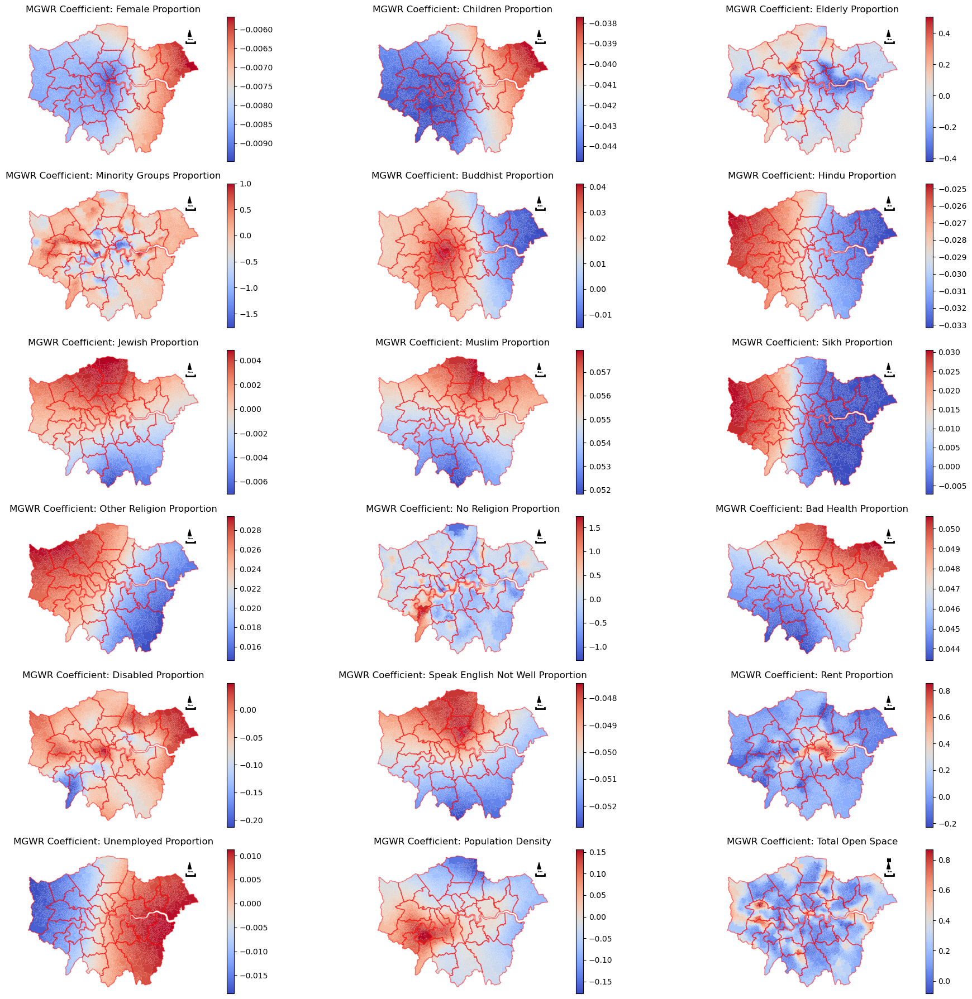

In [105]:
fig, ax = plt.subplots(6, 3, figsize=(20, 18))

plots = [
    ('female%_log_std_mgwr', 'MGWR Coefficient: Female Proportion'),
    ('children%_log_std_mgwr', 'MGWR Coefficient: Children Proportion'),
    ('elder%_log_std_mgwr', 'MGWR Coefficient: Elderly Proportion'),
    ('minority_groups%_log_std_mgwr', 'MGWR Coefficient: Minority Groups Proportion'),
    ('Buddhist%_yj_std_mgwr', 'MGWR Coefficient: Buddhist Proportion'),
    ('Hindu%_yj_std_mgwr', 'MGWR Coefficient: Hindu Proportion'),
    ('Jewish%_yj_std_mgwr', 'MGWR Coefficient: Jewish Proportion'),
    ('Muslim%_log_std_mgwr', 'MGWR Coefficient: Muslim Proportion'),
    ('Sikh%_yj_std_mgwr', 'MGWR Coefficient: Sikh Proportion'),
    ('Other religion%_yj_std_mgwr', 'MGWR Coefficient: Other Religion Proportion'),
    ('No_religion%_log_std_mgwr', 'MGWR Coefficient: No Religion Proportion'),
    ('bad_heath%_log_std_mgwr', 'MGWR Coefficient: Bad Health Proportion'),
    ('disabled%_log_std_mgwr', 'MGWR Coefficient: Disabled Proportion'),
    ('speakEng_notwell%_yj_std_mgwr', 'MGWR Coefficient: Speak English Not Well Proportion'),
    ('rent%_log_std_mgwr', 'MGWR Coefficient: Rent Proportion'),
    ('unemployed%_log_std_mgwr', 'MGWR Coefficient: Unemployed Proportion'),
    ('pop_density_log_std_mgwr', 'MGWR Coefficient: Population Density'),
    ('total_open_space_m2_yj_std_mgwr', 'MGWR Coefficient: Total Open Space')]

for i, (col, title) in enumerate(plots):
    r, c = divmod(i, 3)
    gdf2.plot(column=col, cmap='coolwarm', legend=True, ax=ax[r, c])
    LAD.plot(ax=ax[r, c], edgecolor='red', linewidth=1, alpha=0.5, facecolor='none')
    add_north_arrow(ax[r, c], LAD.total_bounds, fontsize=6)
    add_scalebar(ax[r, c], LAD.total_bounds,length=3000, label="3km", bar_height_ratio=0.01,
             x_offset=0.93, y_offset=0.85, fontsize=3)
    ax[r, c].set_axis_off()
    ax[r, c].set_title(title)


plt.tight_layout()
#plt.savefig('pics/mgwr_coefficient.png', dpi=300, bbox_inches='tight')
plt.show()

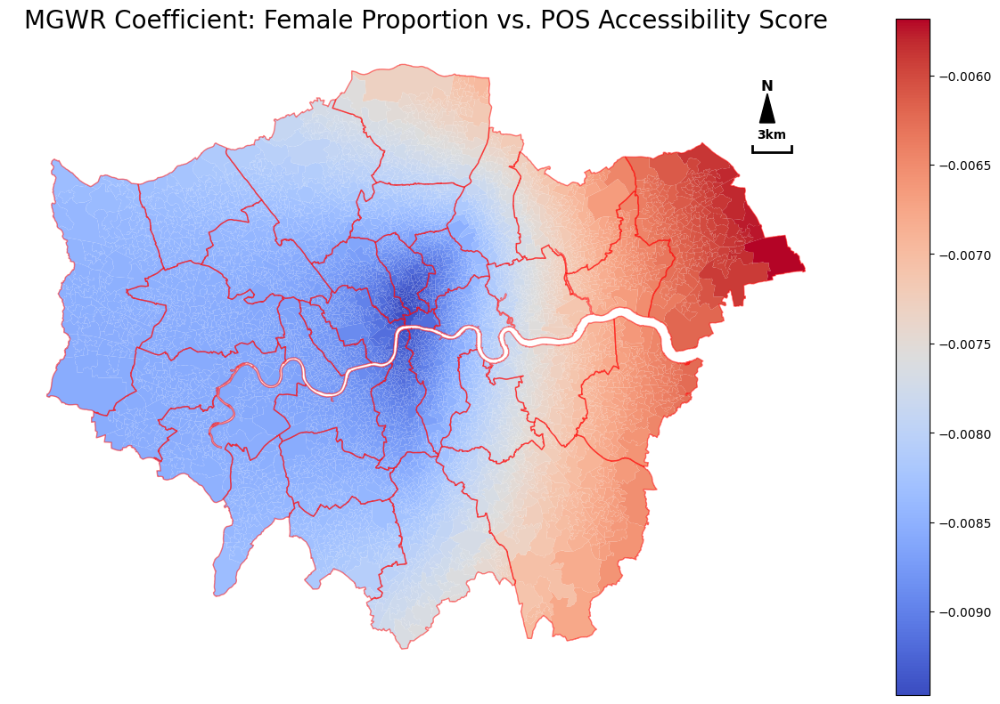

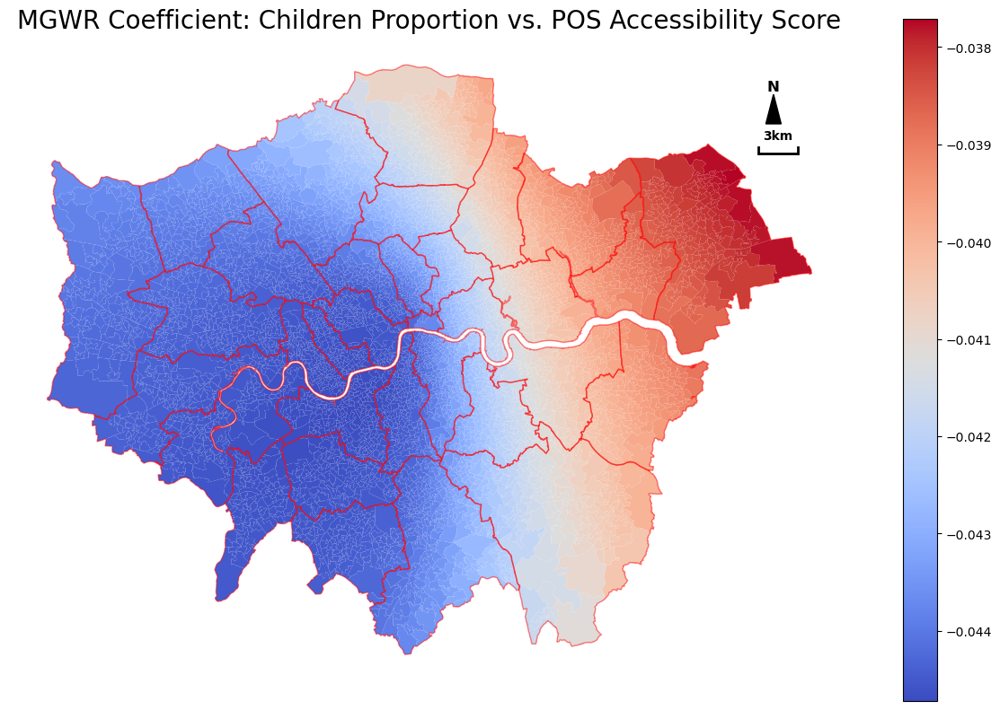

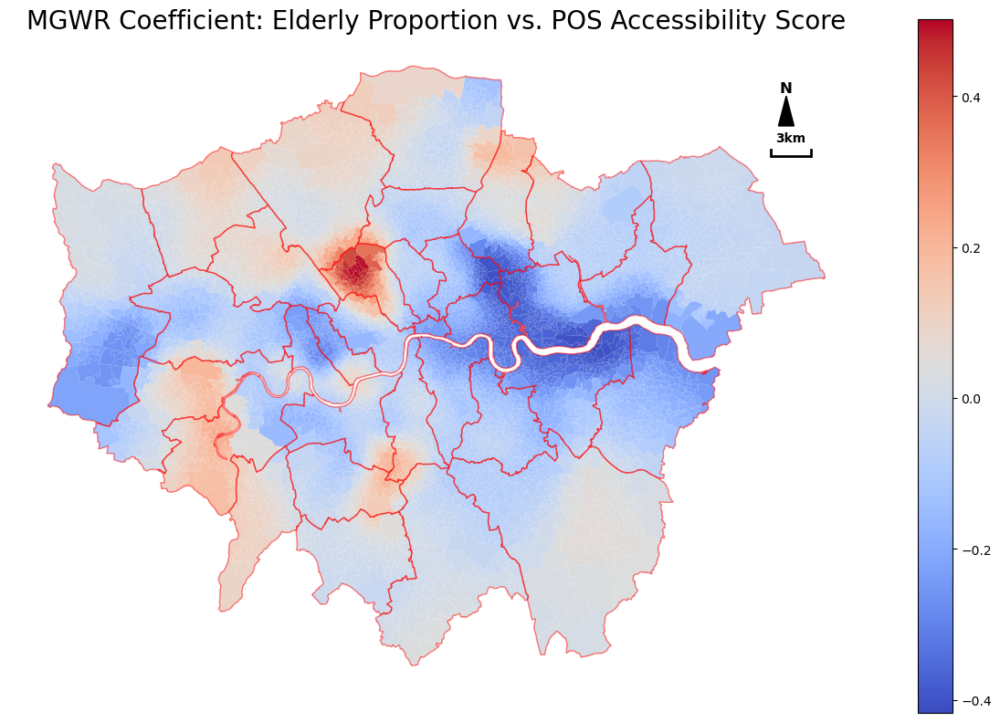

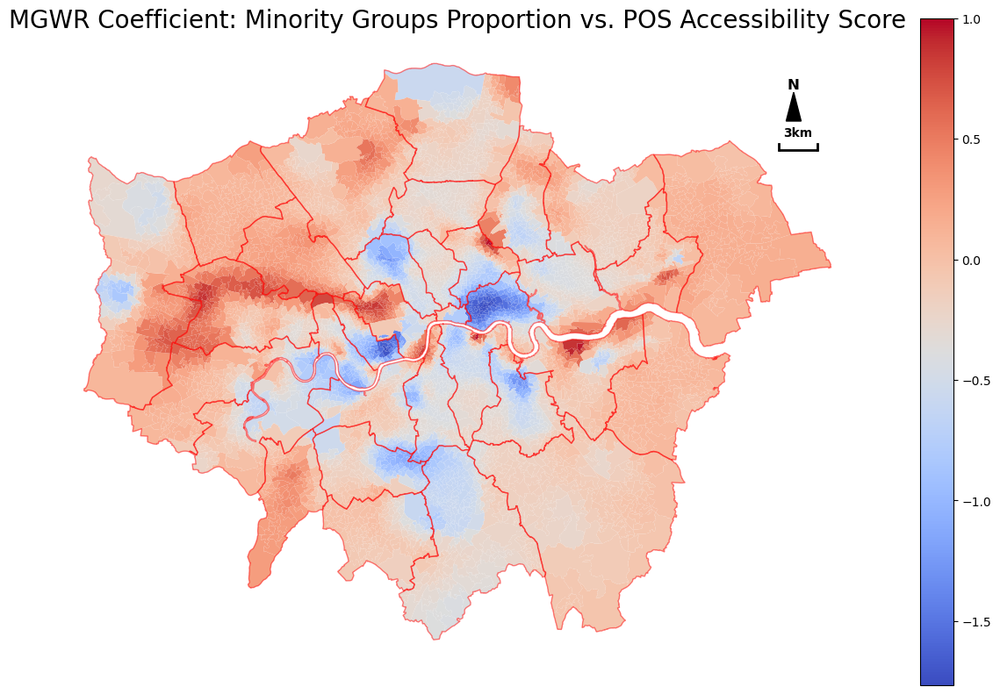

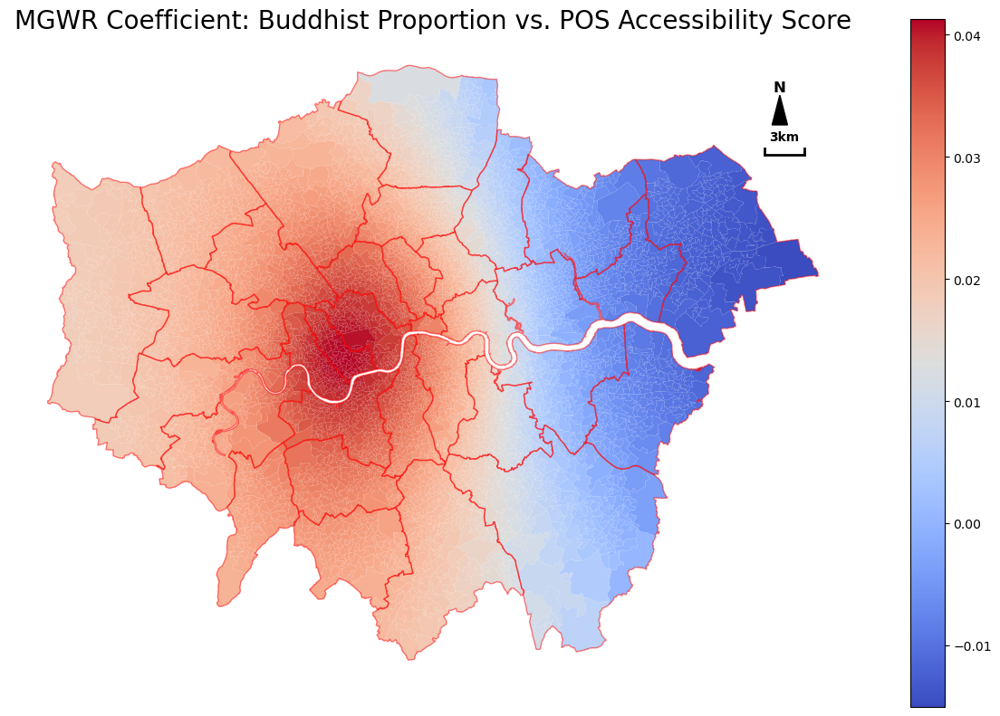

...

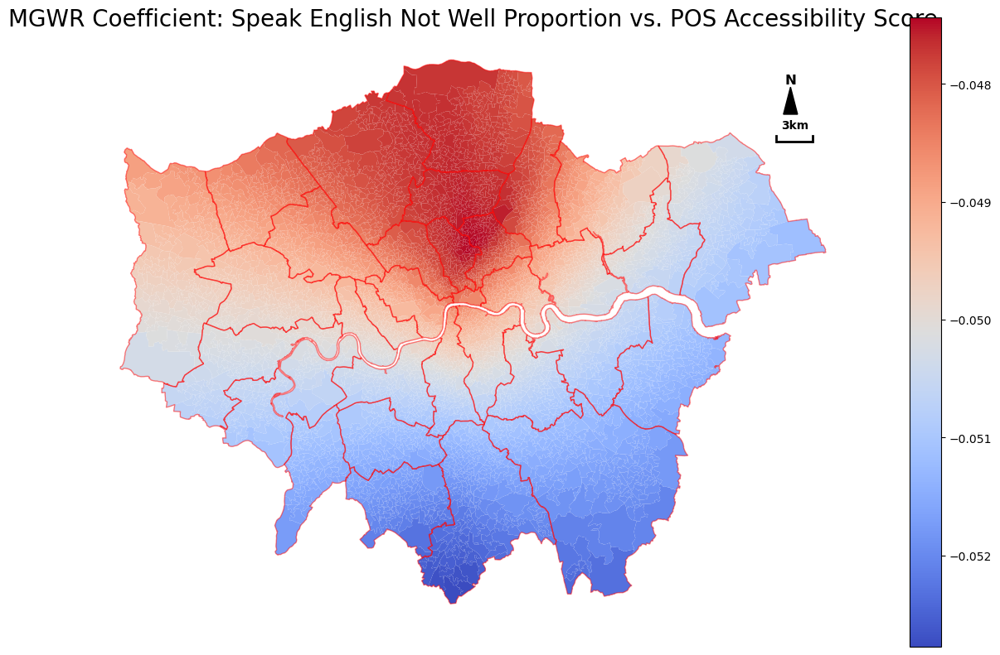

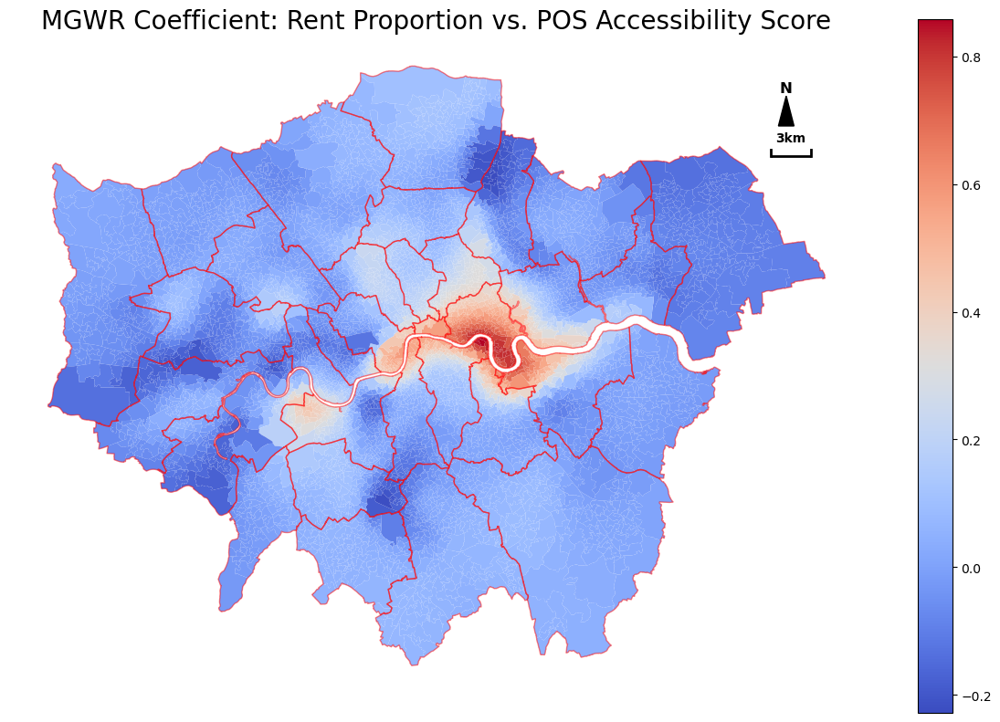

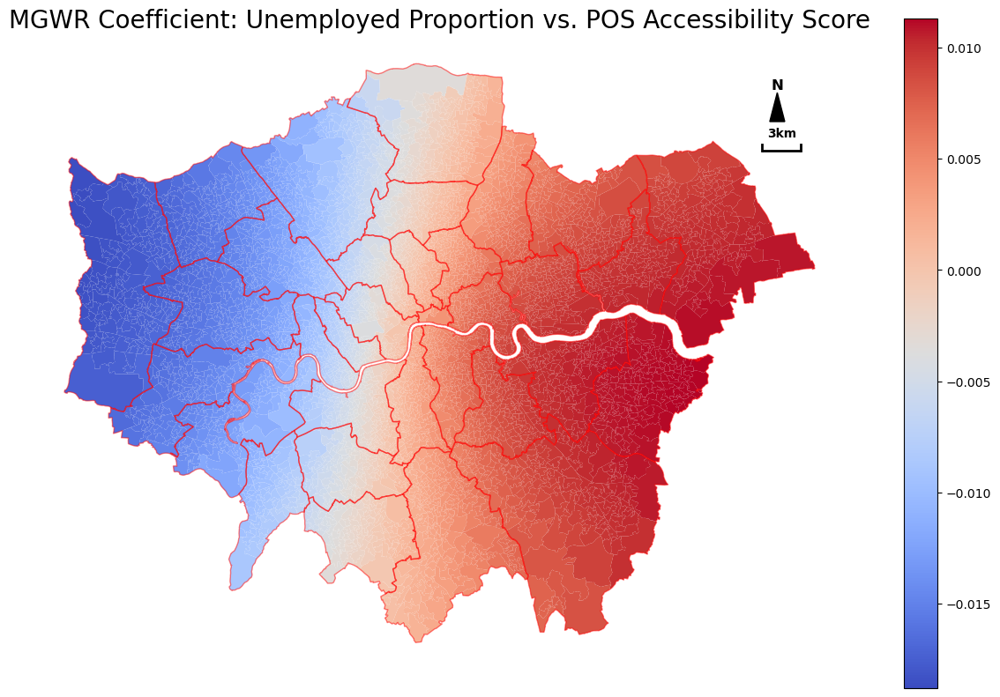

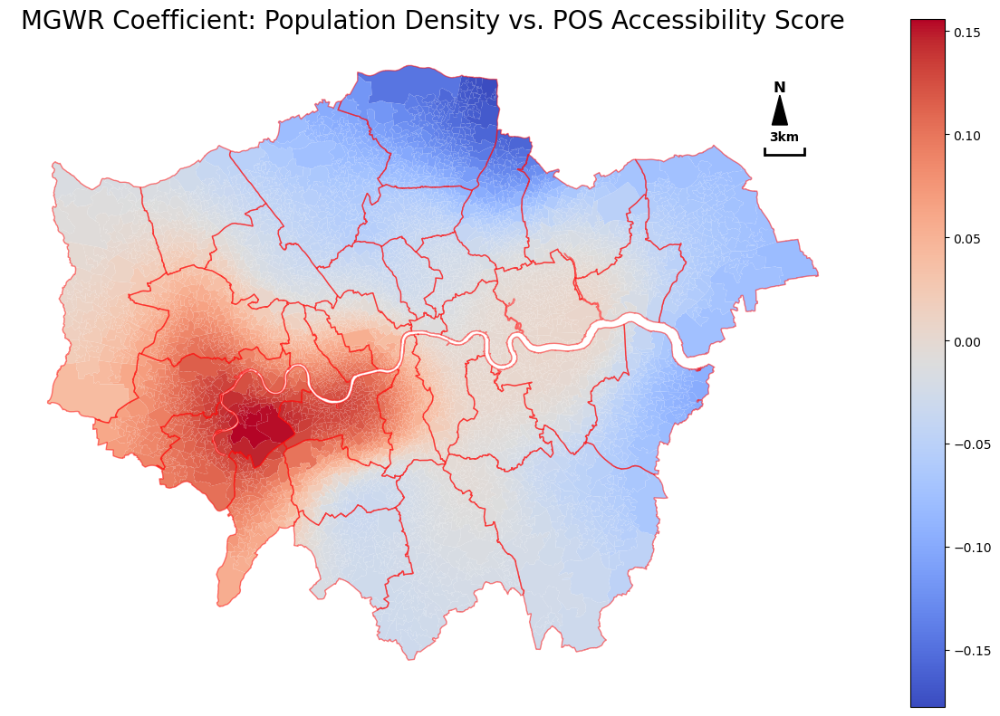

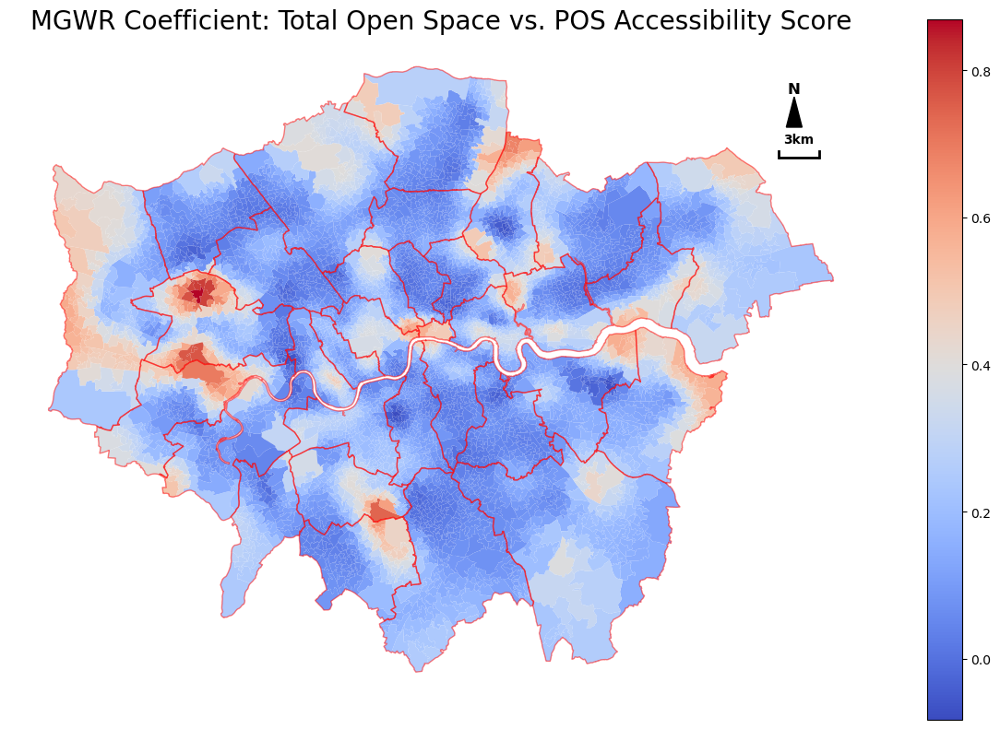

In [110]:
plots = [
    ('female%_log_std_mgwr', 'MGWR Coefficient: Female Proportion vs. POS Accessibility Score'),
    ('children%_log_std_mgwr', 'MGWR Coefficient: Children Proportion vs. POS Accessibility Score'),
    ('elder%_log_std_mgwr', 'MGWR Coefficient: Elderly Proportion vs. POS Accessibility Score'),
    ('minority_groups%_log_std_mgwr', 'MGWR Coefficient: Minority Groups Proportion vs. POS Accessibility Score'),
    ('Buddhist%_yj_std_mgwr', 'MGWR Coefficient: Buddhist Proportion vs. POS Accessibility Score'),
    ('Hindu%_yj_std_mgwr', 'MGWR Coefficient: Hindu Proportion vs. POS Accessibility Score'),
    ('Jewish%_yj_std_mgwr', 'MGWR Coefficient: Jewish Proportion vs. POS Accessibility Score'),
    ('Muslim%_log_std_mgwr', 'MGWR Coefficient: Muslim Proportion vs. POS Accessibility Score'),
    ('Sikh%_yj_std_mgwr', 'MGWR Coefficient: Sikh Proportion vs. POS Accessibility Score'),
    ('Other religion%_yj_std_mgwr', 'MGWR Coefficient: Other Religion Proportion vs. POS Accessibility Score'),
    ('No_religion%_log_std_mgwr', 'MGWR Coefficient: No Religion Proportion vs. POS Accessibility Score'),
    ('bad_heath%_log_std_mgwr', 'MGWR Coefficient: Bad Health Proportion vs. POS Accessibility Score'),
    ('disabled%_log_std_mgwr', 'MGWR Coefficient: Disabled Proportion vs. POS Accessibility Score'),
    ('speakEng_notwell%_yj_std_mgwr', 'MGWR Coefficient: Speak English Not Well Proportion vs. POS Accessibility Score'),
    ('rent%_log_std_mgwr', 'MGWR Coefficient: Rent Proportion vs. POS Accessibility Score'),
    ('unemployed%_log_std_mgwr', 'MGWR Coefficient: Unemployed Proportion vs. POS Accessibility Score'),
    ('pop_density_log_std_mgwr', 'MGWR Coefficient: Population Density vs. POS Accessibility Score'), 
    ('total_open_space_m2_yj_std_mgwr', 'MGWR Coefficient: Total Open Space vs. POS Accessibility Score')]

for col, title in plots:
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # 绘制主要地图
    gdf2.plot(column=col, cmap='coolwarm', legend=True, ax=ax)
    
    # 添加LAD边界
    LAD.plot(ax=ax, edgecolor='red', linewidth=1, alpha=0.5, facecolor='none')
    
    # 添加指北针和比例尺
    add_north_arrow(ax, LAD.total_bounds, fontsize=12)
    add_scalebar(ax, LAD.total_bounds, length=3000, label="3km", 
                bar_height_ratio=0.01, x_offset=0.93, y_offset=0.85, fontsize=10)
    
    # 设置标题和样式
    ax.set_axis_off()
    ax.set_title(title, fontsize=20)
    
    plt.tight_layout()
    plt.savefig(f'pics/mgwr_{col}.png', dpi=300, bbox_inches='tight')
    plt.show()
